In [4]:
import pandas as pd
import numpy as np
from pathlib import Path
import scanpy as sc
import phenograph
!pip install lifelines
!pip install scanpy[louvain]

# set scanpy plotting parameter to dpi = 150
sc.settings.set_figure_params(dpi=150)

# Set up data folder
from pathlib import Path
# change this to where you save the data
DATA = Path("/home/juanthe3_gmail_com/Genomics")

In [5]:
#loading data
ge = sc.read_csv(DATA / "RAWDATA_sc_endoderm_all_cells_counts.csv")
meta = pd.read_csv(DATA / "sc_endoderm_all_cells_metadata.csv",
                   index_col=0)

ge.shape #rows=number of cells, columns=genes?

(113051, 20897)

In [6]:
#concatenate elements of meta data to count matrix

ge.obs = pd.concat([ge.obs, meta.loc[ge.obs_names]], axis=1, sort=False)
ge.obs.head()

,Cluster,Timepoint,CellType
E85anterior2A_TTTATGCTCGGATGGA,E8.75_ap: 0,E8.75_ap,Mes
E85anterior2A_TTTATGCTCCTAGGGC,E8.75_ap: 0,E8.75_ap,Mes
E85anterior2A_TTTATGCTCCAACCAA,E8.75_ap:2,E8.75,Gut tube
E85anterior2A_TTTATGCAGTGGGTTG,E8.75_ap: 8,E8.75_ap,Mes
E85anterior2A_TTTACTGTCGGAGGTA,E8.75_ap:3,E8.75,Gut tube


In [7]:
print( "length of array: {}".format(len(meta['Timepoint'].unique())))
meta['Timepoint'].unique()
#meta['Timepoint'].unique()

length of array: 8


array(['E8.75_ap', 'E8.75', 'E4.5', 'E3.5', 'E8.75_gfp', 'E5.5', 'E6.5',
       'E7.5'], dtype=object)

In [8]:
#to align with paper, sort by timepoint (then cluster based on cell type--have many different cell types)


E875_ap_idx = ge.obs.Timepoint == "E8.75_ap"
E875_idx = ge.obs.Timepoint == "E8.75"
E45_idx = ge.obs.Timepoint == "E4.5"
E35_idx = ge.obs.Timepoint == "E3.5"
E875_gfp_idx = ge.obs.Timepoint == "E8.75_gfp"
E55_idx = ge.obs.Timepoint == "E5.5"
E65_idx = ge.obs.Timepoint == "E6.5"
E75_idx = ge.obs.Timepoint == "E7.5"

ge_E875_ap=ge[E875_ap_idx]
ge_E875=ge[E875_idx]
ge_E45=ge[E45_idx]
ge_E35=ge[E35_idx]
ge_E875_gfp=ge[E875_gfp_idx]
ge_E55=ge[E55_idx]
ge_E65=ge[E65_idx]
ge_E75=ge[E75_idx]

#enumerating number of cells at each timepoint
print("The number of cells at each timepoint: \n \
E8.75_ap: {} \n \
E8.75: {} \n \
E4.5: {} \n \
E3.5: {} \n \
E8.75_gfp: {} \n \
E5.5: {} \n \
E6.5: {} \n \
E7.5: {} \n \
".format(ge_E875_ap.shape[0],ge_E875.shape[0], ge_E45.shape[0], ge_E35.shape[0], ge_E875_gfp.shape[0], ge_E55.shape[0], ge_E65.shape[0], ge_E75.shape[0]))



The number of cells at each timepoint: 
 E8.75_ap: 5423 
 E8.75: 42599 
 E4.5: 232 
 E3.5: 774 
 E8.75_gfp: 9379 
 E5.5: 11550 
 E6.5: 9244 
 E7.5: 33850 
 


In [9]:

#E8.75 anterior/posterior neighbor connectivity


sc.tl.pca(ge_E875_ap, svd_solver='arpack')
sc.pp.neighbors(ge_E875_ap, n_neighbors=15, n_pcs=25)
sc.pp.scale(ge_E875_ap, max_value=10)

In [10]:
"""
#TAKES VERY LONG TO RUN 

#E8.75 anterior/posterior tSNE
#run on all 20897 dimensions (genes)?


sc.tl.tsne(ge_E875_ap, use_rep='X')
sc.settings.set_figure_params(dpi=150)
sc.pl.tsne(ge_E875_ap)
"""

"\n#TAKES VERY LONG TO RUN \n\n#E8.75 anterior/posterior tSNE\n#run on all 20897 dimensions (genes)?\n\n\nsc.tl.tsne(ge_E875_ap, use_rep='X')\nsc.settings.set_figure_params(dpi=150)\nsc.pl.tsne(ge_E875_ap)\n"

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.6354002952575684 seconds
Jaccard graph constructed in 2.3918771743774414 seconds
Wrote graph to binary file in 0.7217621803283691 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.797542
After 8 runs, maximum modularity is Q = 0.798604
After 9 runs, maximum modularity is Q = 0.799935
Louvain completed 29 runs in 12.505982398986816 seconds
PhenoGraph complete in 16.27970027923584 seconds


... storing 'Cluster' as categorical
... storing 'Timepoint' as categorical
... storing 'CellType' as categorical


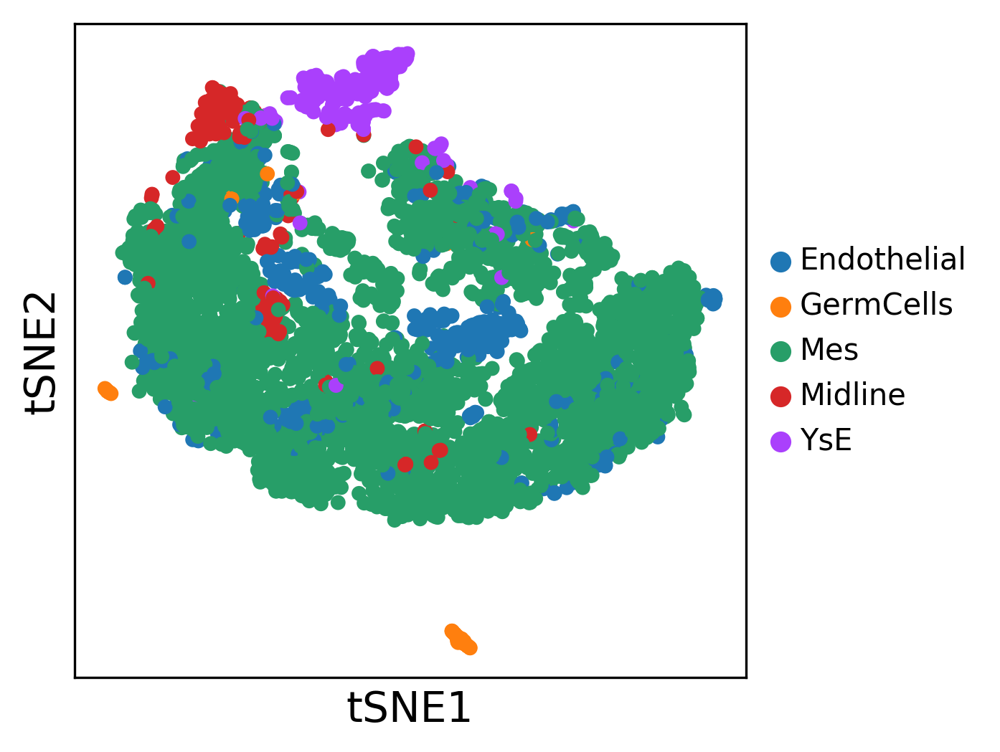

In [11]:
#E8.75_ap phenograph tSNE

result = sc.external.tl.phenograph(ge_E875_ap.obsm['X_pca'], k = 30) #compute phenograph clusters
sc.tl.tsne(ge_E875_ap, random_state = 7)
sc.pl.tsne(ge_E875_ap, title= "", color = ['CellType'], s = 100, palette = sc.pl.palettes.vega_20_scanpy, legend_fontsize = 10)



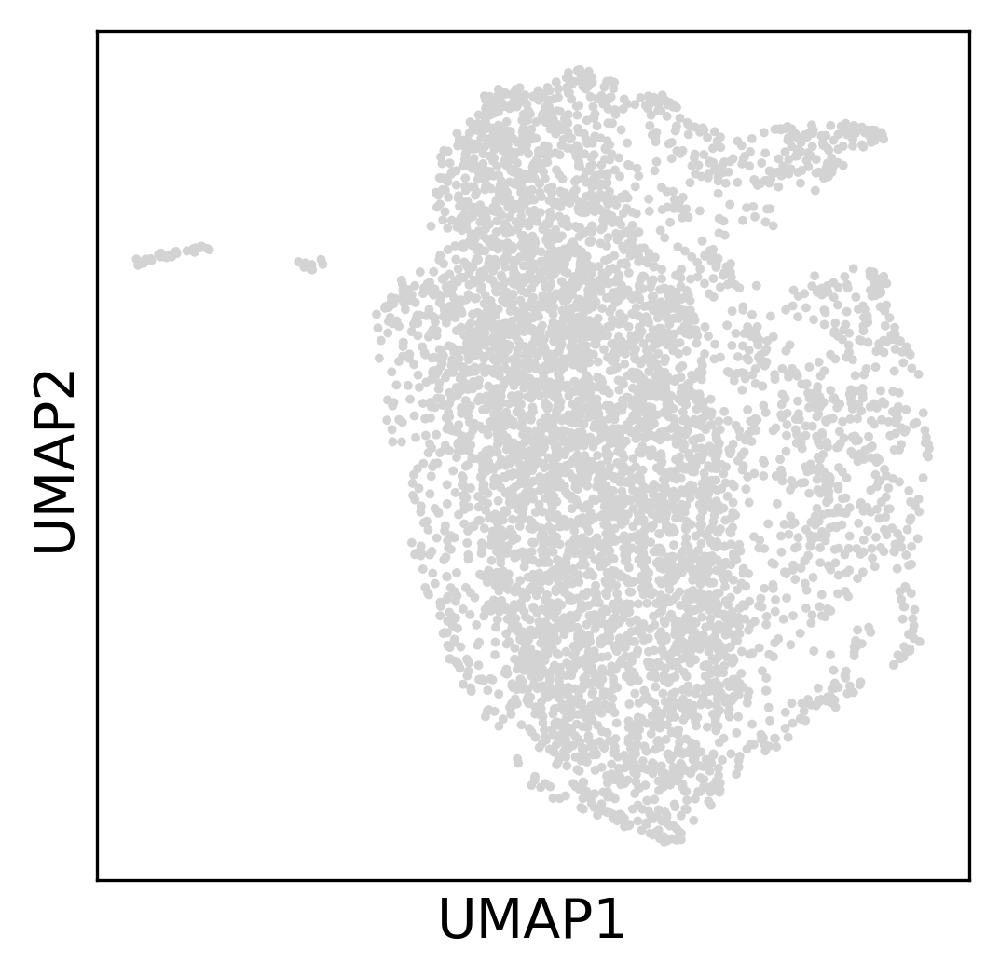

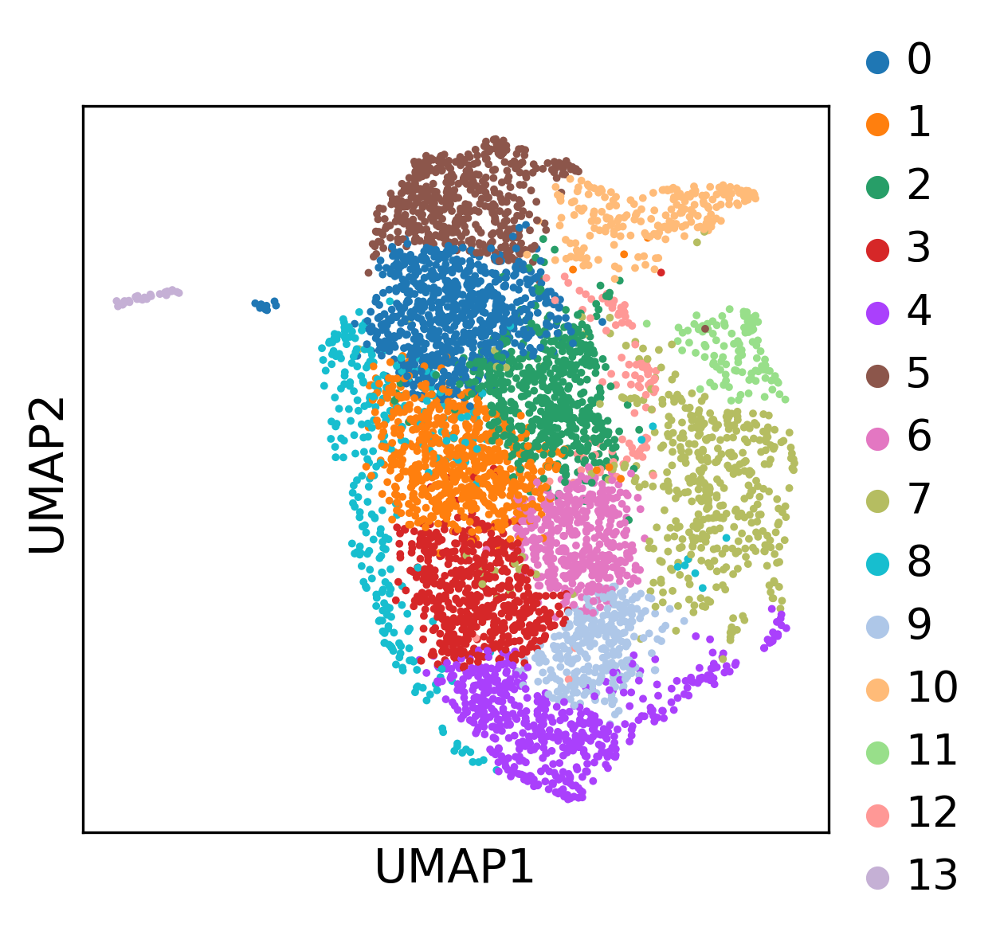

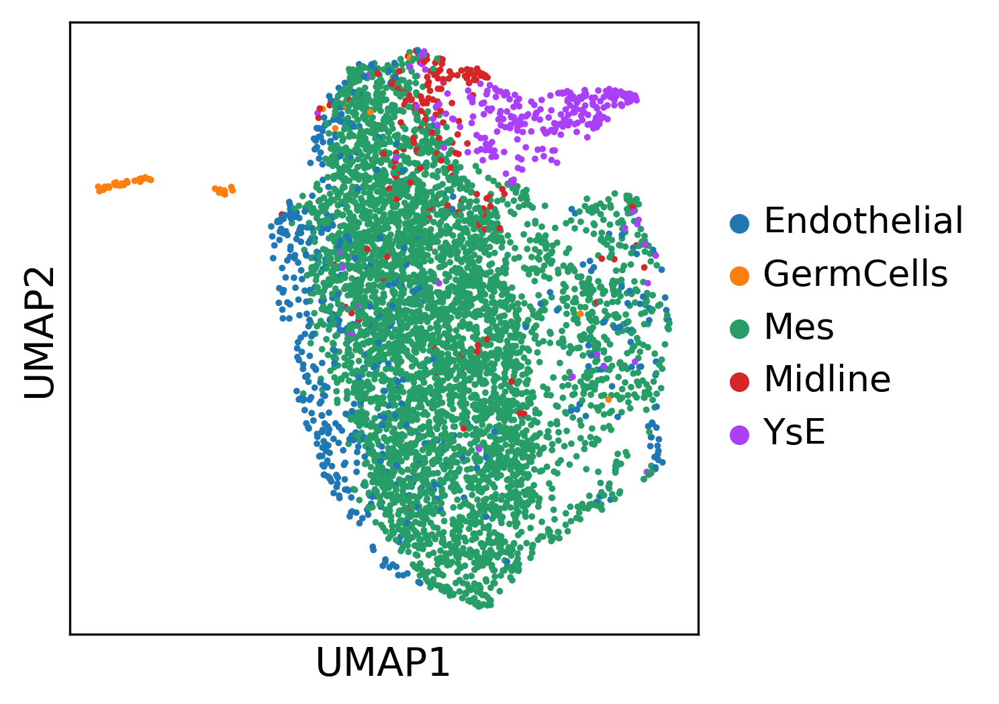

In [12]:
#E8.75 anterior/posterior UMAP

sc.tl.umap(ge_E875_ap)
sc.settings.set_figure_params(dpi=150)
sc.pl.umap(ge_E875_ap)

sc.tl.louvain(ge_E875_ap) 
sc.pl.umap(ge_E875_ap, title="", color=['louvain']) 
sc.pl.umap(ge_E875_ap, title="",color=['CellType'])


In [13]:
#E8.75  neighbor connectivity
#Note: warning may appear

sc.tl.pca(ge_E875, svd_solver='arpack')
sc.pp.neighbors(ge_E875, n_neighbors=15, n_pcs=25)
sc.pp.scale(ge_E875, max_value=10)


/home/juanthe3_gmail_com/anaconda3/envs/genomics/lib/python3.6/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../anaconda3/envs/genomics/lib/python3.6/site-packages/umap/rp_tree.py", line 135:
@numba.njit(fastmath=True, nogil=True, parallel=True)
def euclidean_random_projection_split(data, indices, rng_state):
^

  state.func_ir.loc))
/home/juanthe3_gmail_com/anaconda3/envs/genomics/lib/python3.6/site-packages/umap/nndescent.py:92: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "..

In [14]:
"""
#Takes too long to generate--skip

#E8.75 TSNE

sc.tl.tsne(ge_E875)
sc.settings.set_figure_params(dpi=150)
sc.pl.tsne(ge_E875)

"""

'\n#Takes too long to generate--skip\n\n#E8.75 TSNE\n\nsc.tl.tsne(ge_E875)\nsc.settings.set_figure_params(dpi=150)\nsc.pl.tsne(ge_E875)\n\n'

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 6.781238079071045 seconds
Jaccard graph constructed in 6.211374759674072 seconds
Wrote graph to binary file in 5.235621452331543 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.889432
After 2 runs, maximum modularity is Q = 0.890928
Louvain completed 22 runs in 40.7792432308197 seconds
PhenoGraph complete in 59.16623282432556 seconds


... storing 'Cluster' as categorical
... storing 'Timepoint' as categorical
... storing 'CellType' as categorical


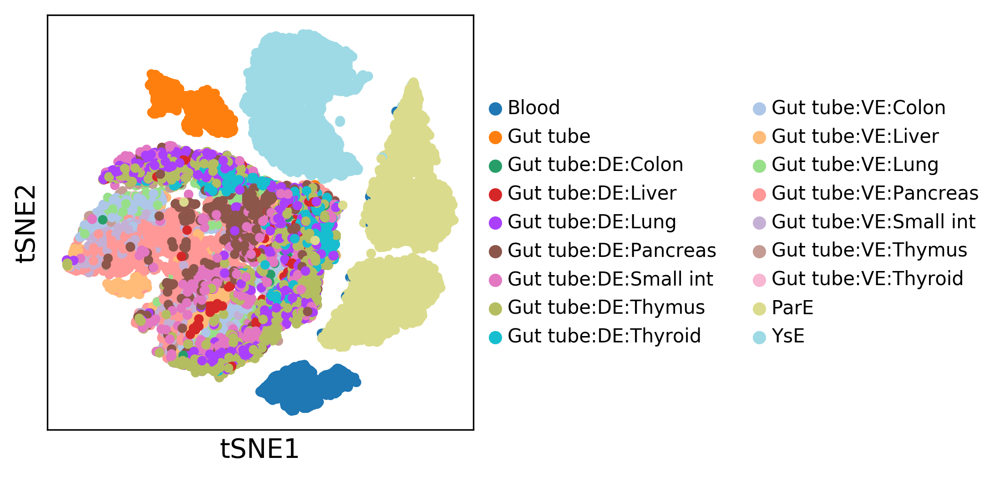

In [15]:
#E8.75 phenograph tSNE

result = sc.external.tl.phenograph(ge_E875.obsm['X_pca'], k = 30) #compute phenograph clusters
sc.tl.tsne(ge_E875, random_state = 7)
sc.pl.tsne(ge_E875, title= "", color = ['CellType'], s = 100, palette = sc.pl.palettes.vega_20_scanpy, legend_fontsize = 10)



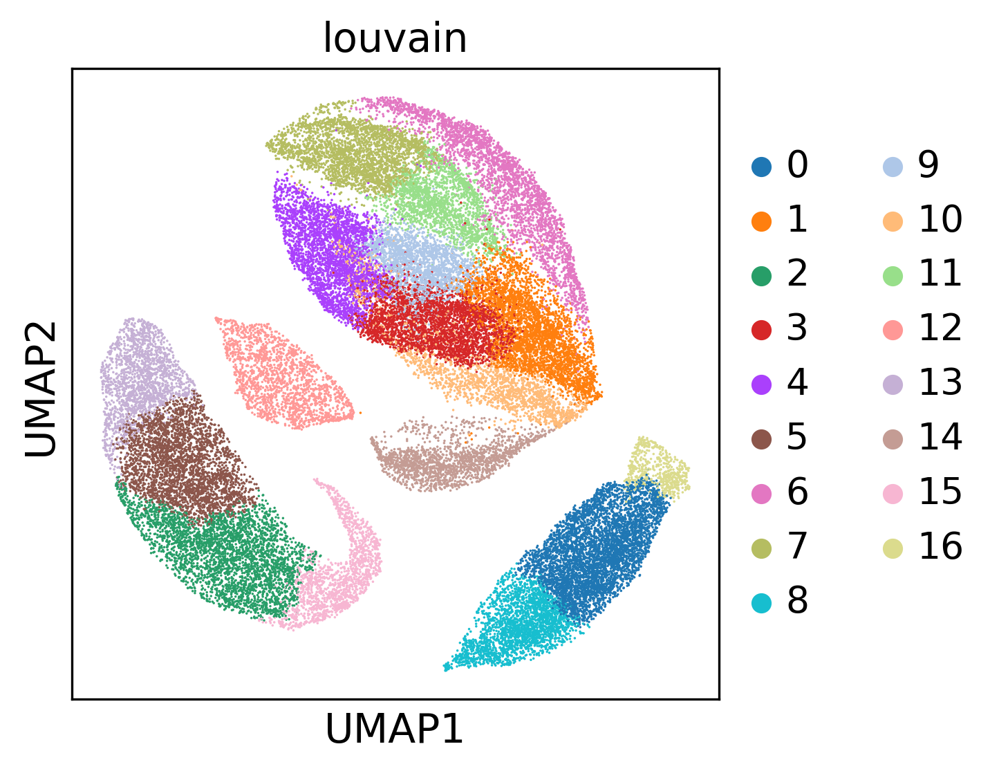

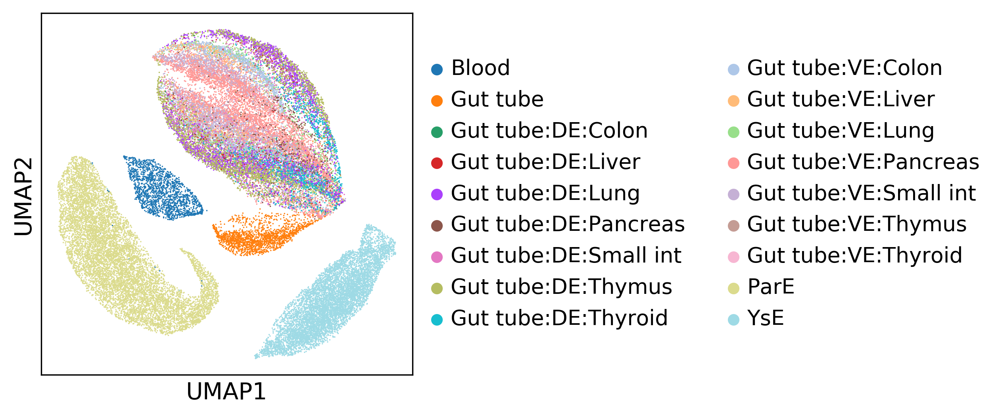

In [16]:
#E8.75 UMAP

sc.tl.umap(ge_E875)
sc.settings.set_figure_params(dpi=150)


sc.tl.louvain(ge_E875)


sc.pl.umap(ge_E875, color=['louvain'])
sc.pl.umap(ge_E875, title= "", color=['CellType'])
#sc.pl.umap(ge_E875, color=['Cluster'])

In [17]:
#E4.5  neighbor connectivity

sc.tl.pca(ge_E45, svd_solver='arpack')
sc.pp.neighbors(ge_E45, n_neighbors=15, n_pcs=25)
sc.pp.scale(ge_E45, max_value=10)


... storing 'Cluster' as categorical
... storing 'Timepoint' as categorical
... storing 'CellType' as categorical


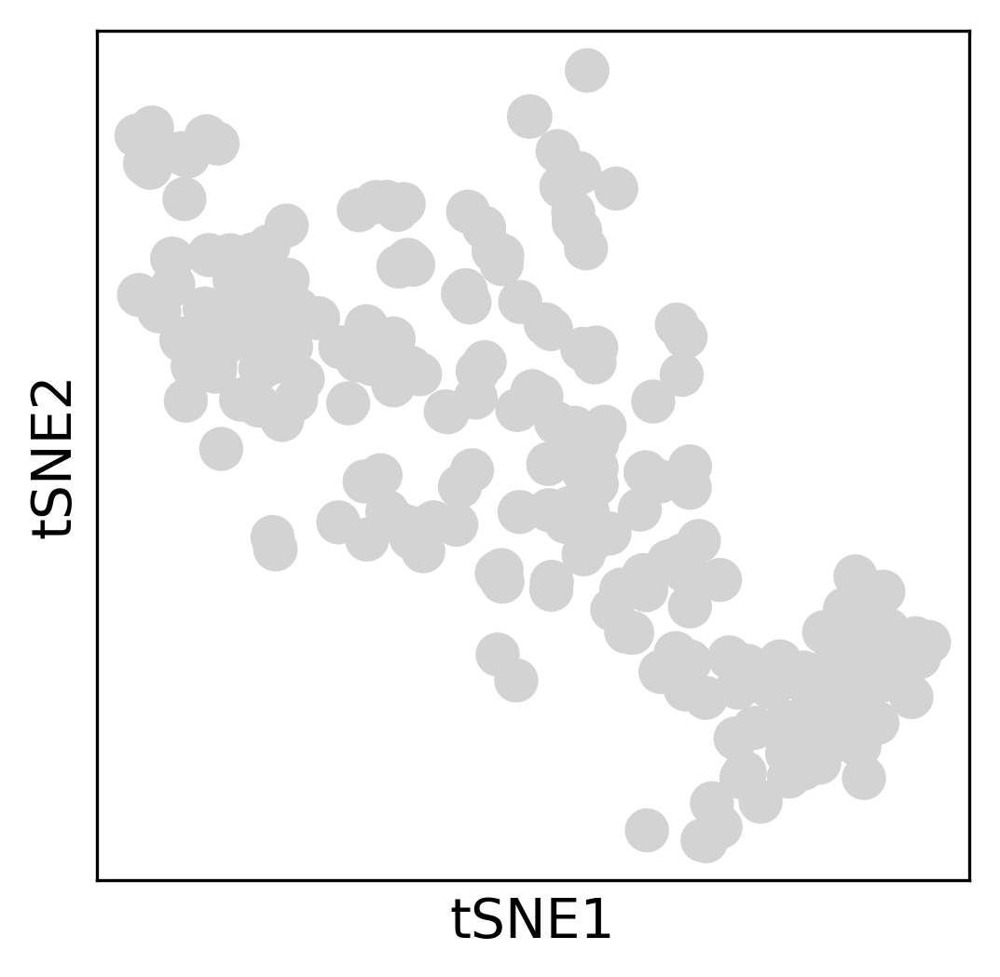

In [18]:
#E4.5 TSNE


sc.tl.tsne(ge_E45)
sc.settings.set_figure_params(dpi=150)
sc.pl.tsne(ge_E45)

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.10737991333007812 seconds
Jaccard graph constructed in 1.7893469333648682 seconds
Wrote graph to binary file in 0.017889738082885742 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.639781
After 5 runs, maximum modularity is Q = 0.640911
Louvain completed 25 runs in 8.075883150100708 seconds
PhenoGraph complete in 9.999914169311523 seconds


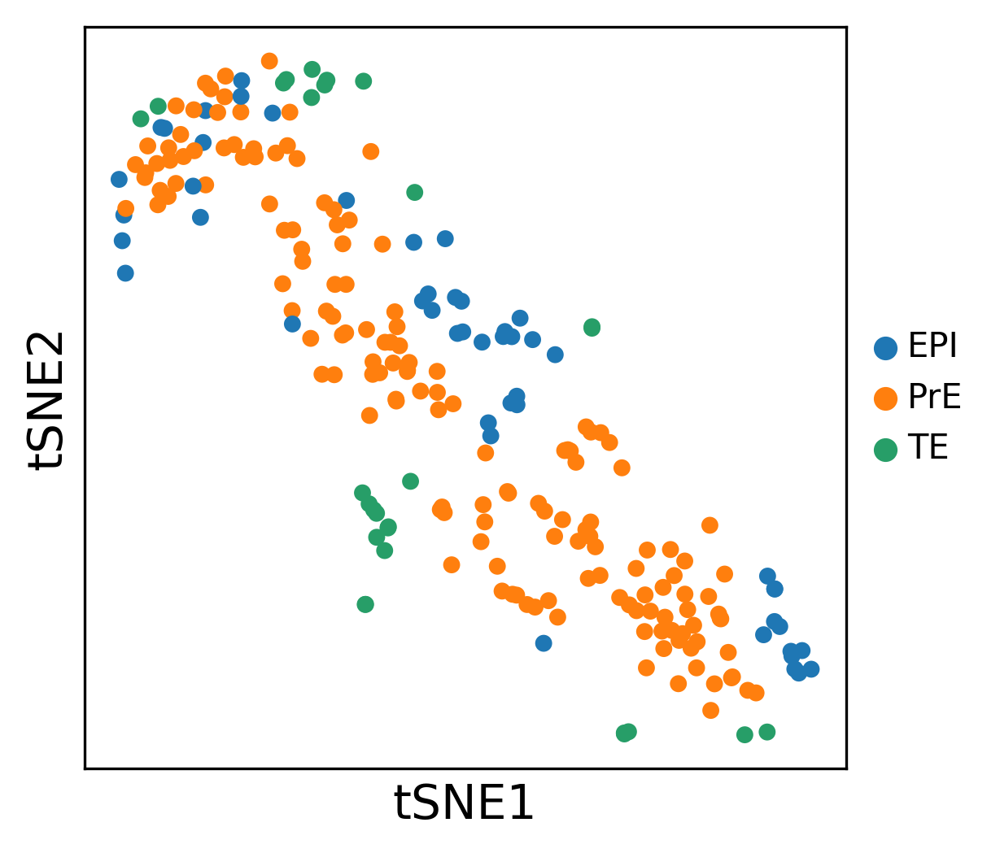

In [19]:
#E4.5 phenograph tSNE

result = sc.external.tl.phenograph(ge_E45.obsm['X_pca'], k = 30) #compute phenograph clusters
sc.tl.tsne(ge_E45, random_state = 7)
sc.pl.tsne(ge_E45, title="", color = ['CellType'], s = 100, palette = sc.pl.palettes.vega_20_scanpy, legend_fontsize = 10)



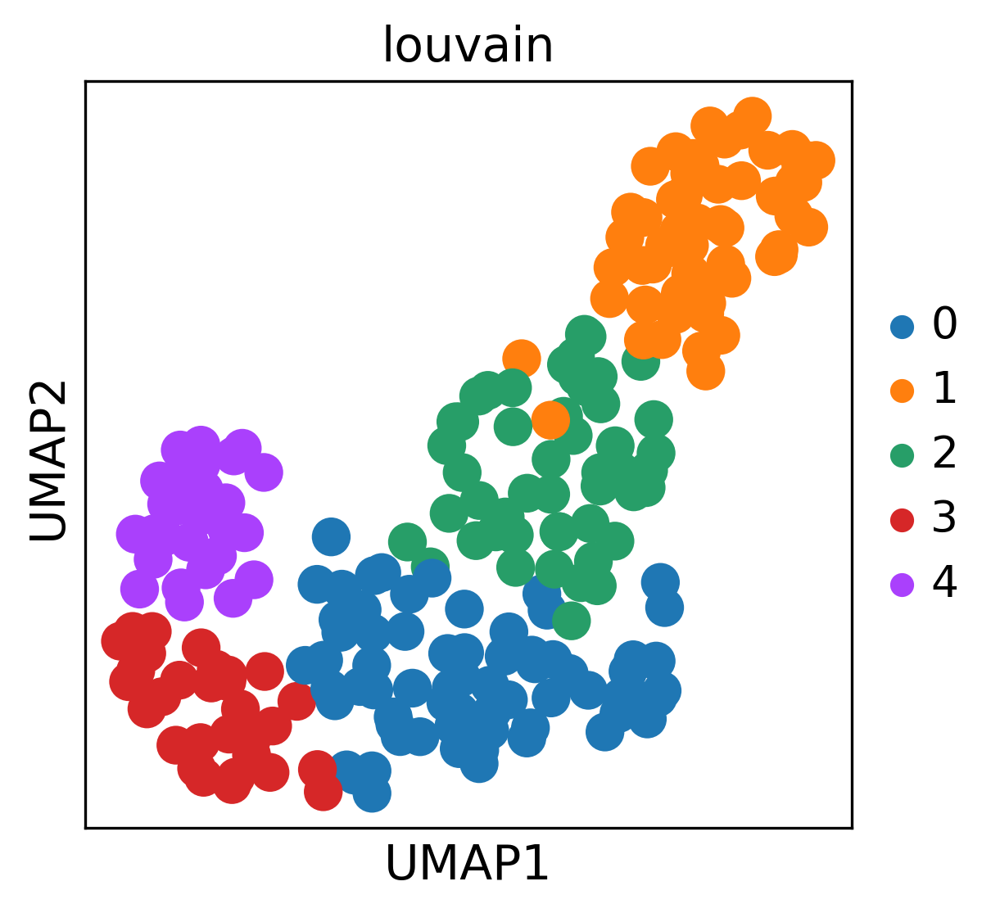

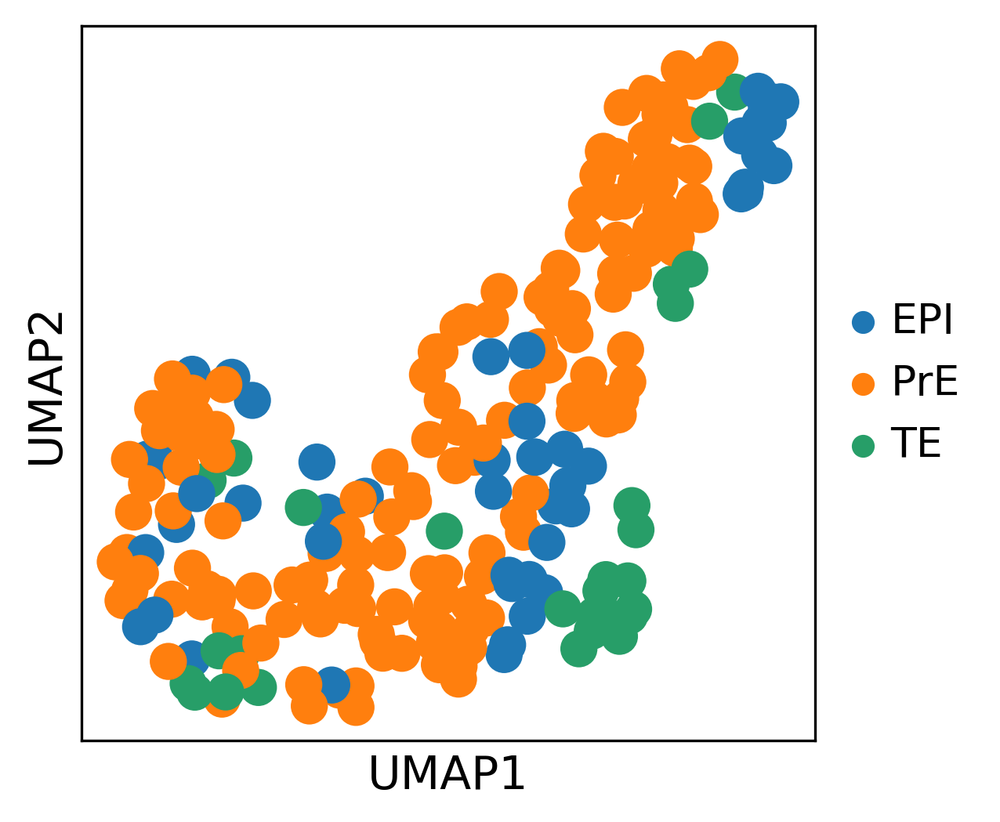

In [20]:
#E4.5  UMAP

sc.tl.umap(ge_E45)
sc.settings.set_figure_params(dpi=150)


sc.tl.louvain(ge_E45)


sc.pl.umap(ge_E45, color=['louvain'])
sc.pl.umap(ge_E45, title="", color=['CellType'])
#sc.pl.umap(ge_E45, color=['Cluster'])

In [21]:
#E3.5 neighbor connectivity

sc.tl.pca(ge_E35, svd_solver='arpack')
sc.pp.neighbors(ge_E35, n_neighbors=15, n_pcs=25)
sc.pp.scale(ge_E35, max_value=10)

... storing 'Cluster' as categorical
... storing 'Timepoint' as categorical
... storing 'CellType' as categorical


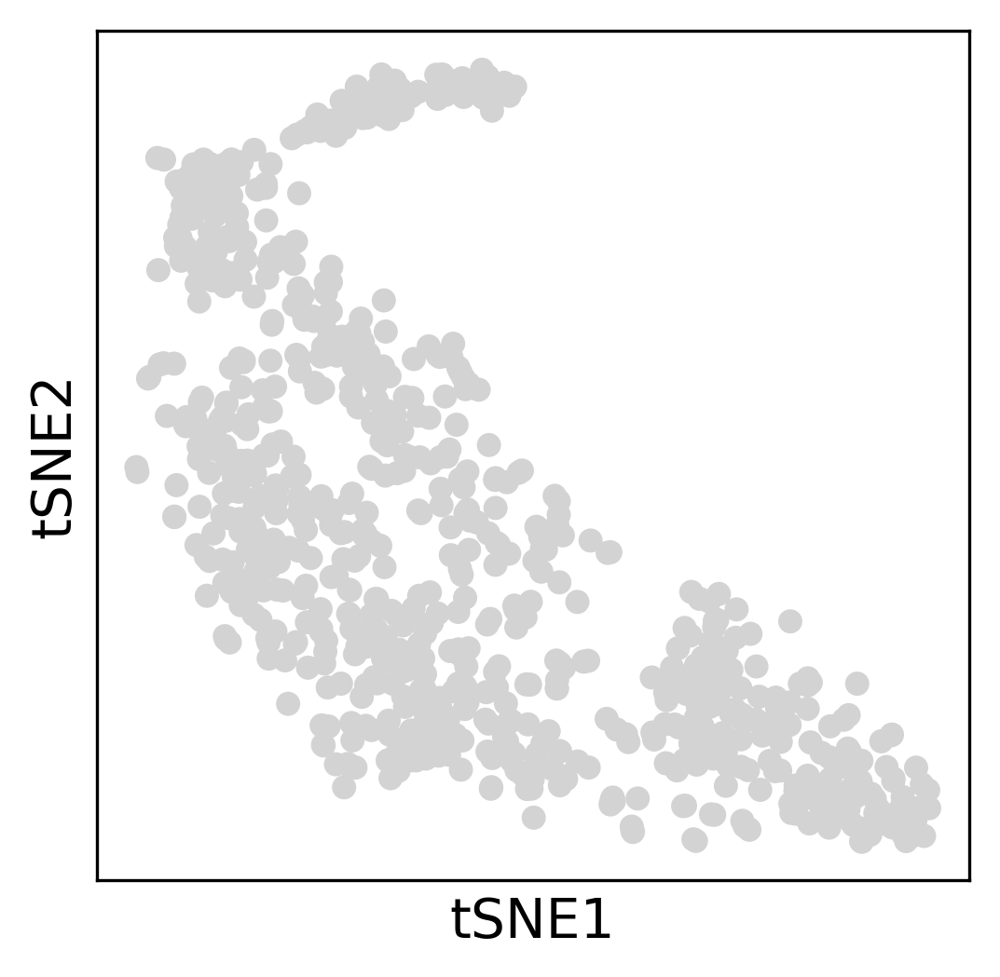

In [22]:
#E3.5 TSNE

sc.tl.tsne(ge_E35)
sc.settings.set_figure_params(dpi=150)
sc.pl.tsne(ge_E35)

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.10822558403015137 seconds
Jaccard graph constructed in 1.8523716926574707 seconds
Wrote graph to binary file in 0.17116689682006836 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.756906
After 3 runs, maximum modularity is Q = 0.758626
Louvain completed 23 runs in 7.737814664840698 seconds
PhenoGraph complete in 9.8947172164917 seconds


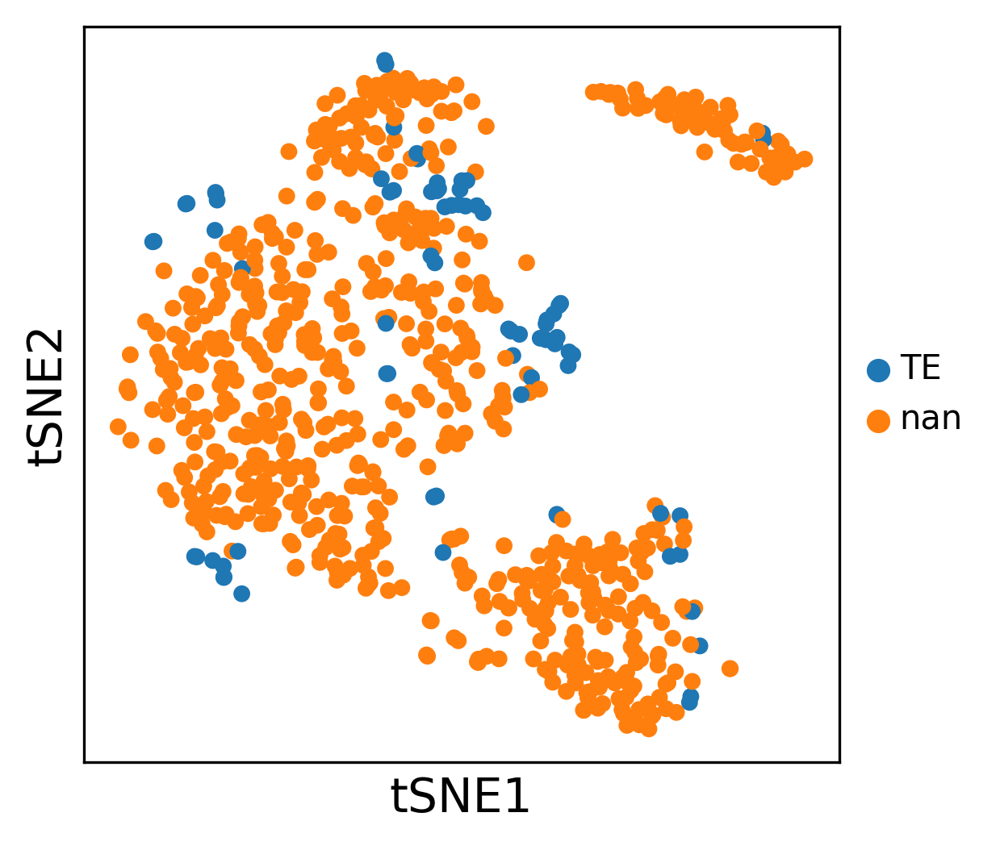

In [23]:
#E3.5 phenograph tSNE

result = sc.external.tl.phenograph(ge_E35.obsm['X_pca'], k = 30) #compute phenograph clusters
sc.tl.tsne(ge_E35, random_state = 7)
sc.pl.tsne(ge_E35, title="", color = ['CellType'], s = 100, palette = sc.pl.palettes.vega_20_scanpy, legend_fontsize = 10)



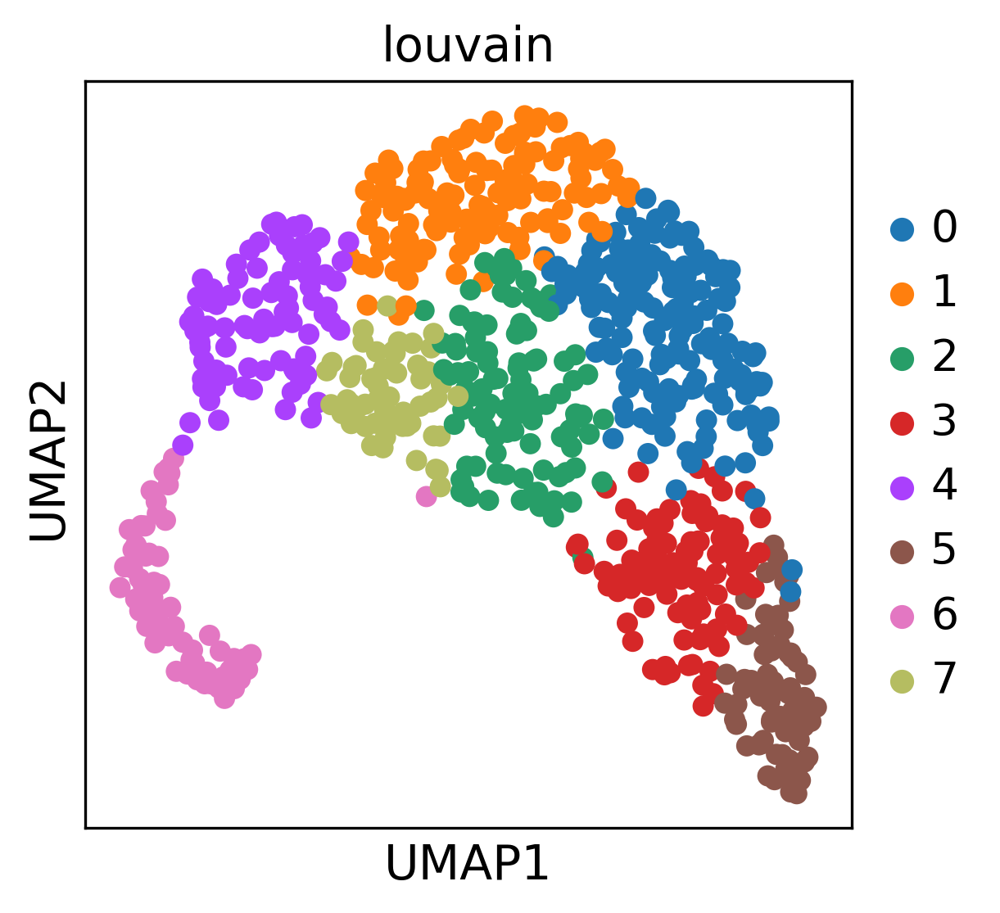

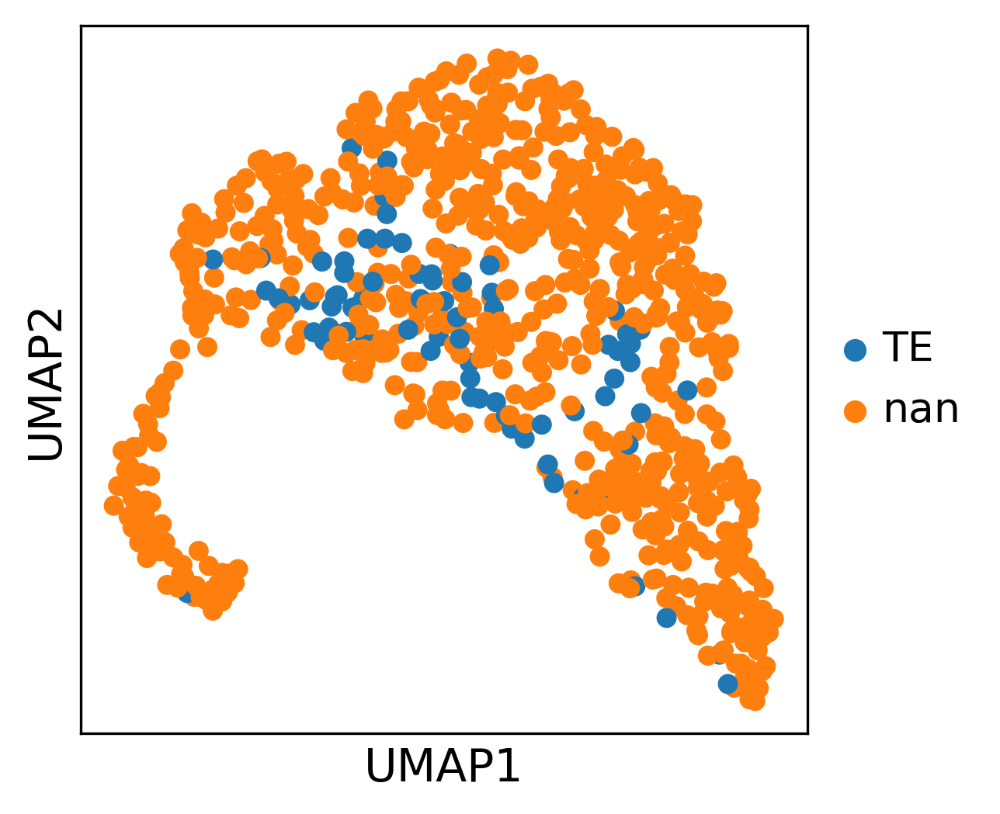

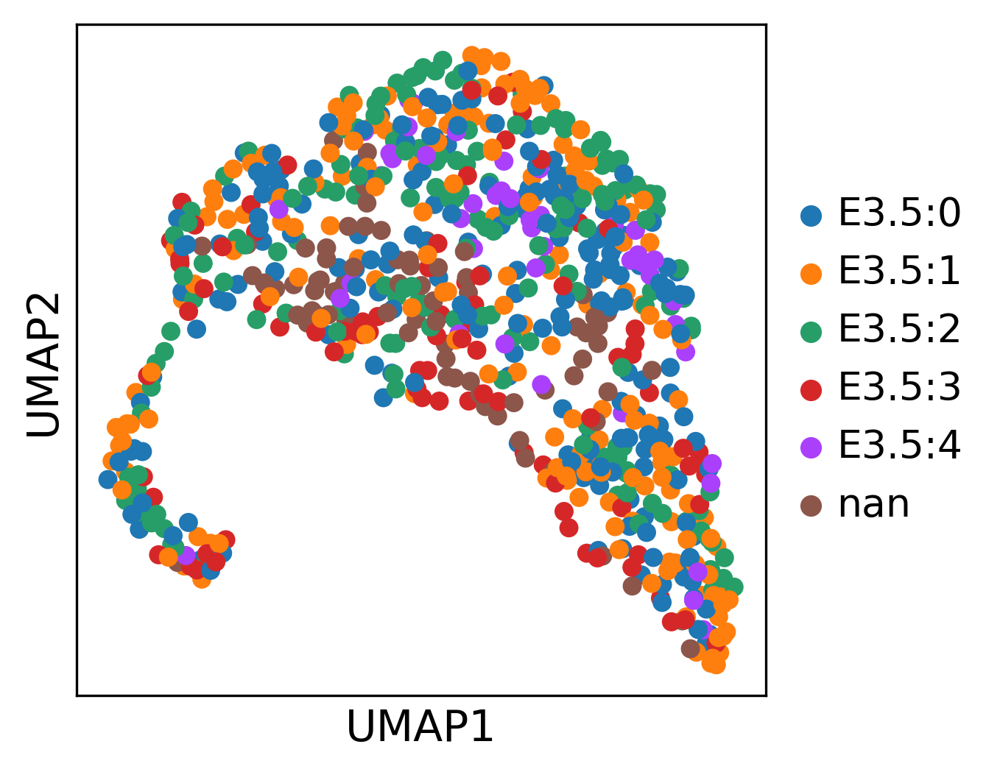

In [43]:
#E3.5 UMAP

sc.tl.umap(ge_E35)
sc.settings.set_figure_params(dpi=150)


sc.tl.louvain(ge_E35)


sc.pl.umap(ge_E35, color=['louvain'])
sc.pl.umap(ge_E35, title= "", color=['CellType'])
sc.pl.umap(ge_E35, title="", color=['Cluster'])

In [25]:
#E8.75_GFP neighbor connectivity

sc.tl.pca(ge_E875_gfp, svd_solver='arpack')
sc.pp.neighbors(ge_E875_gfp, n_neighbors=15, n_pcs=25)
sc.pp.scale(ge_E875_gfp, max_value=10)

/home/juanthe3_gmail_com/anaconda3/envs/genomics/lib/python3.6/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../anaconda3/envs/genomics/lib/python3.6/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


... storing 'Cluster' as categorical
... storing 'Timepoint' as categorical
... storing 'CellType' as categorical


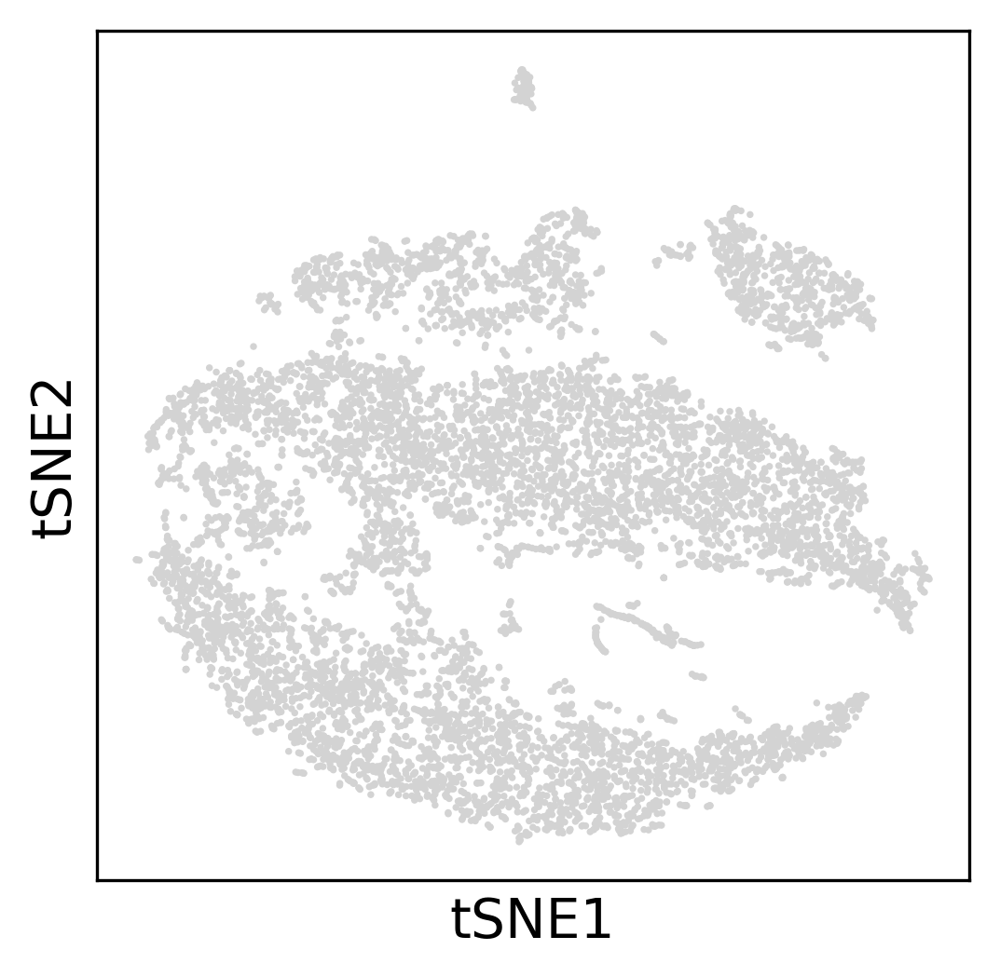

In [26]:
#E8.75_GFP TSNE

sc.tl.tsne(ge_E875_gfp)
sc.settings.set_figure_params(dpi=150)
sc.pl.tsne(ge_E875_gfp)

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 1.263514518737793 seconds
Jaccard graph constructed in 3.3468172550201416 seconds
Wrote graph to binary file in 1.3598222732543945 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.853003
After 17 runs, maximum modularity is Q = 0.854117
Louvain completed 37 runs in 16.98078179359436 seconds
PhenoGraph complete in 23.021788358688354 seconds


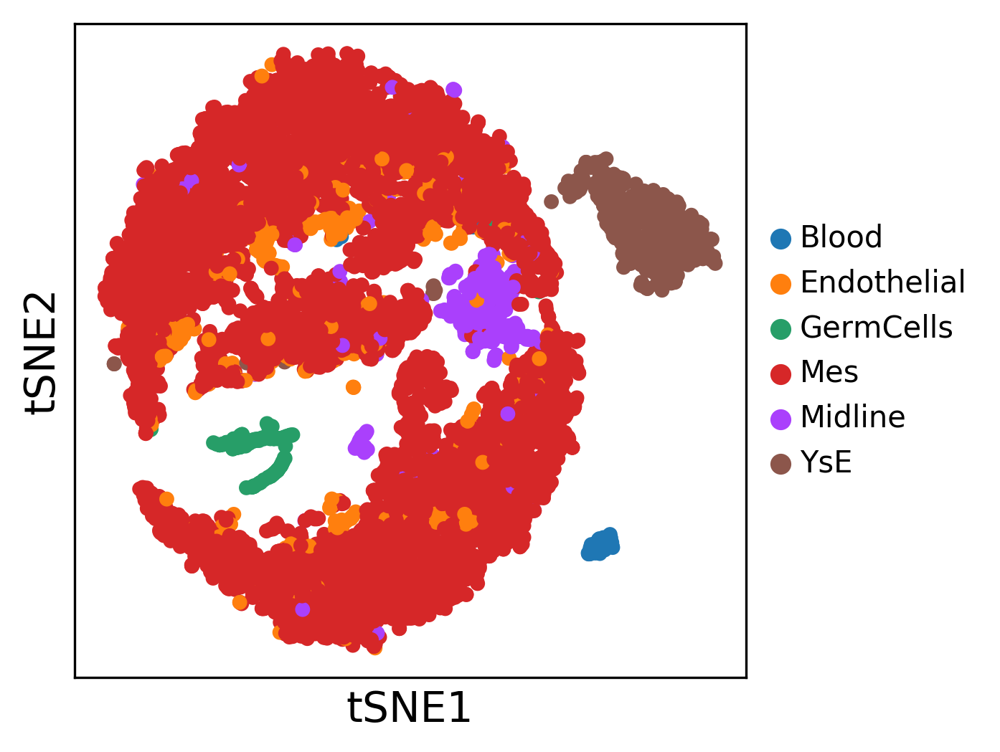

In [27]:
#E8.75_GFP phenograph tSNE

result = sc.external.tl.phenograph(ge_E875_gfp.obsm['X_pca'], k = 30) #compute phenograph clusters
sc.tl.tsne(ge_E875_gfp, random_state = 7)
sc.pl.tsne(ge_E875_gfp, title="", color = ['CellType'], s = 100, palette = sc.pl.palettes.vega_20_scanpy, legend_fontsize = 10)



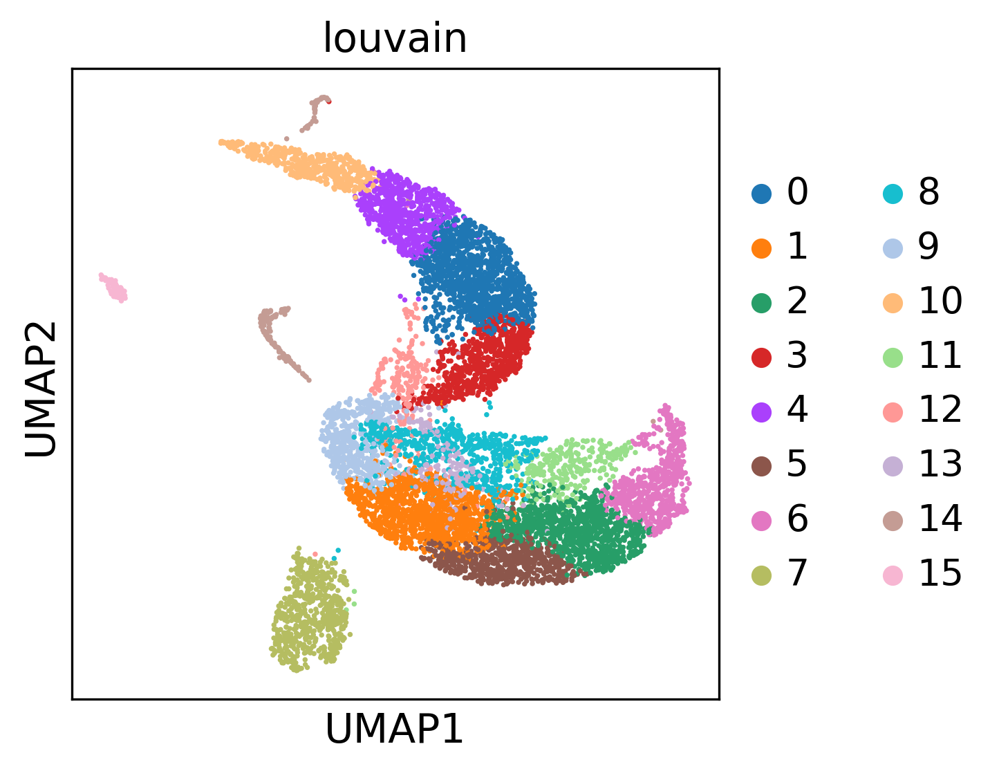

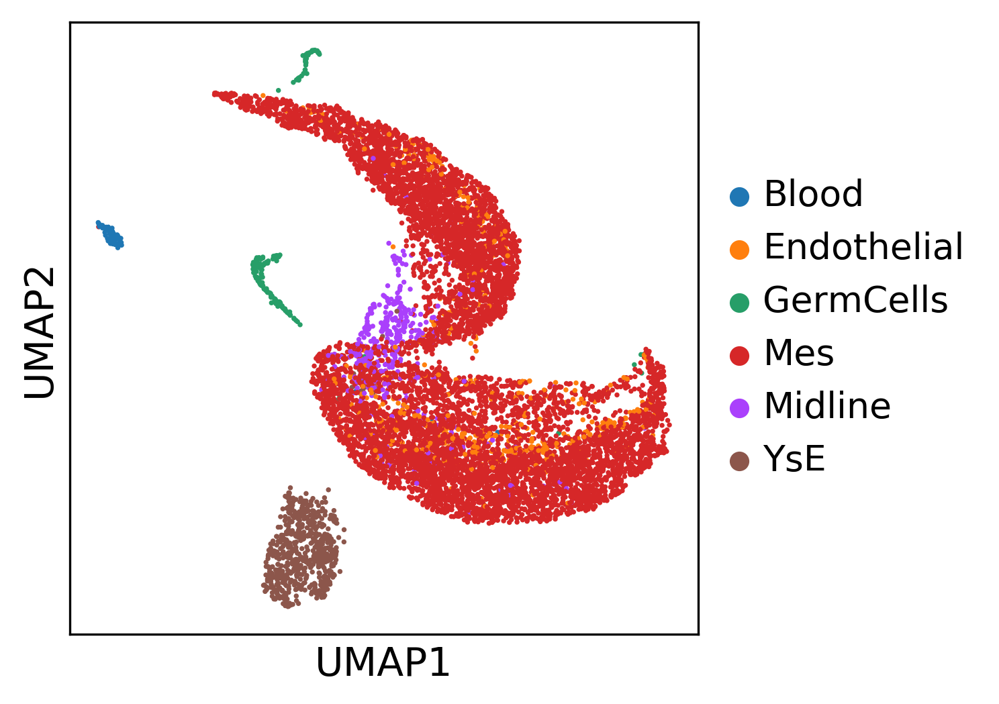

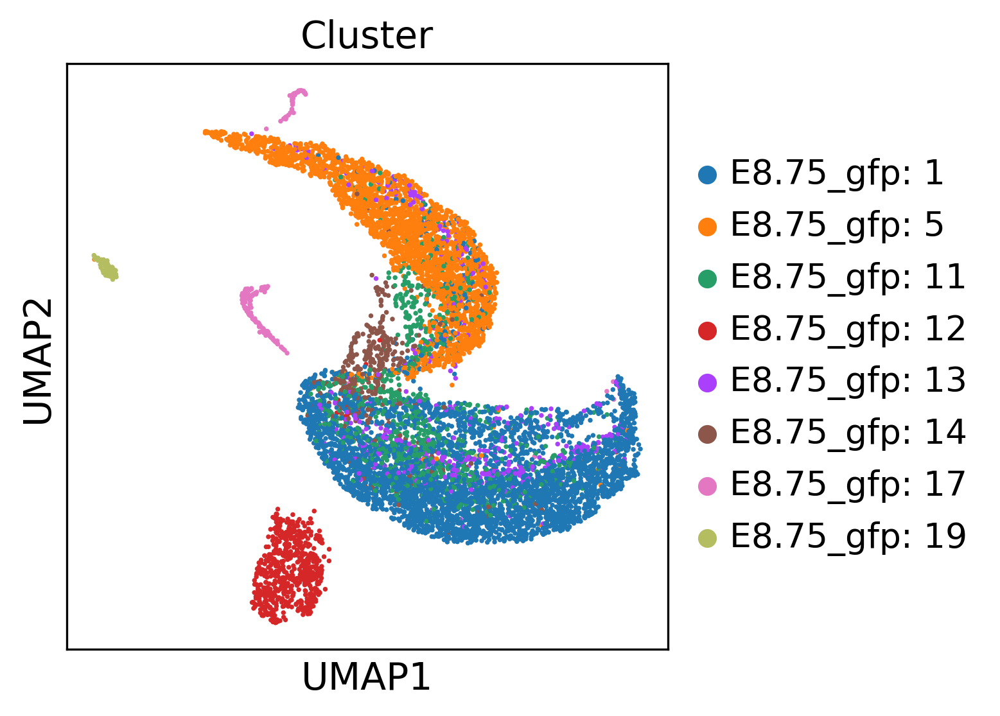

In [28]:
#E8.75_GFP UMAP

sc.tl.umap(ge_E875_gfp)
sc.settings.set_figure_params(dpi=150)


sc.tl.louvain(ge_E875_gfp)


sc.pl.umap(ge_E875_gfp, color=['louvain'])
sc.pl.umap(ge_E875_gfp, title="", color=['CellType'])
sc.pl.umap(ge_E875_gfp, color=['Cluster'])

In [29]:
#E5.5 neighbor connectivity

sc.tl.pca(ge_E55, svd_solver='arpack')
sc.pp.neighbors(ge_E55, n_neighbors=15, n_pcs=25)
sc.pp.scale(ge_E55, max_value=10)

/home/juanthe3_gmail_com/anaconda3/envs/genomics/lib/python3.6/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../anaconda3/envs/genomics/lib/python3.6/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


... storing 'Cluster' as categorical
... storing 'Timepoint' as categorical
... storing 'CellType' as categorical


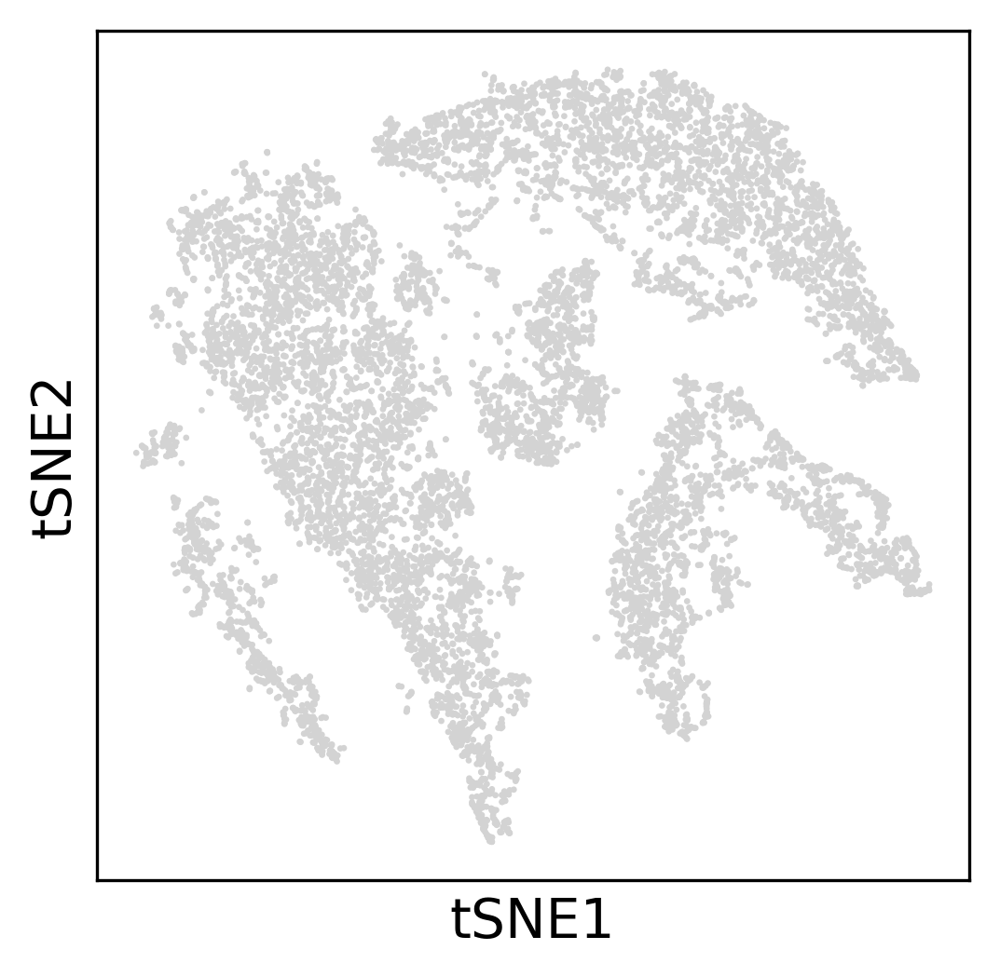

In [30]:
#E5.5 TSNE

sc.tl.tsne(ge_E55)
sc.settings.set_figure_params(dpi=150)
sc.pl.tsne(ge_E55)

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.9807579517364502 seconds
Jaccard graph constructed in 3.3746771812438965 seconds
Wrote graph to binary file in 1.4968376159667969 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.878803
After 4 runs, maximum modularity is Q = 0.8817
Louvain completed 24 runs in 12.852075099945068 seconds
PhenoGraph complete in 18.750847578048706 seconds


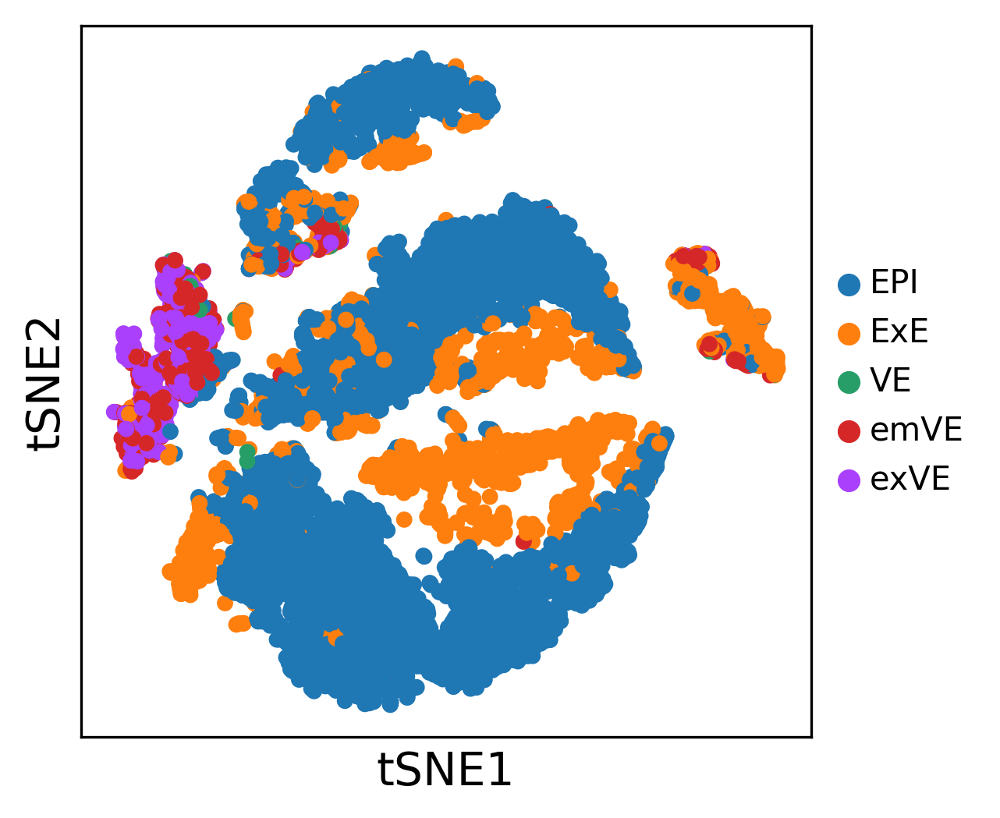

In [31]:
#E5.5 phenograph tSNE

result = sc.external.tl.phenograph(ge_E55.obsm['X_pca'], k = 30) #compute phenograph clusters
sc.tl.tsne(ge_E55, random_state = 7)
sc.pl.tsne(ge_E55, title="", color = ['CellType'], s = 100, palette = sc.pl.palettes.vega_20_scanpy, legend_fontsize = 10)



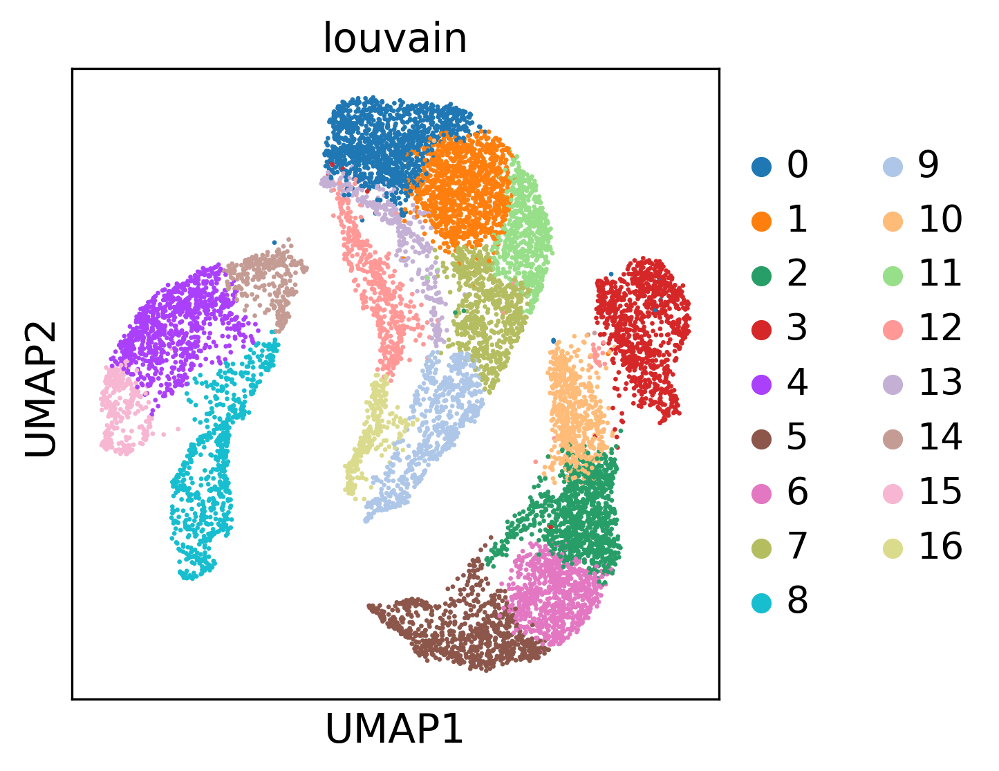

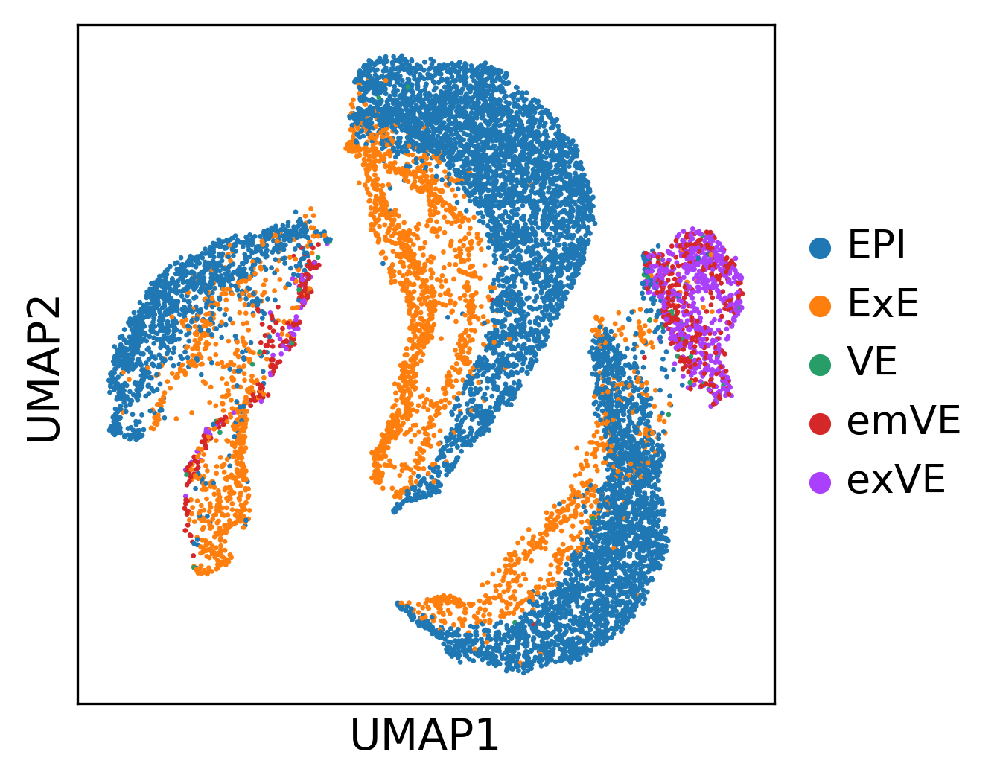

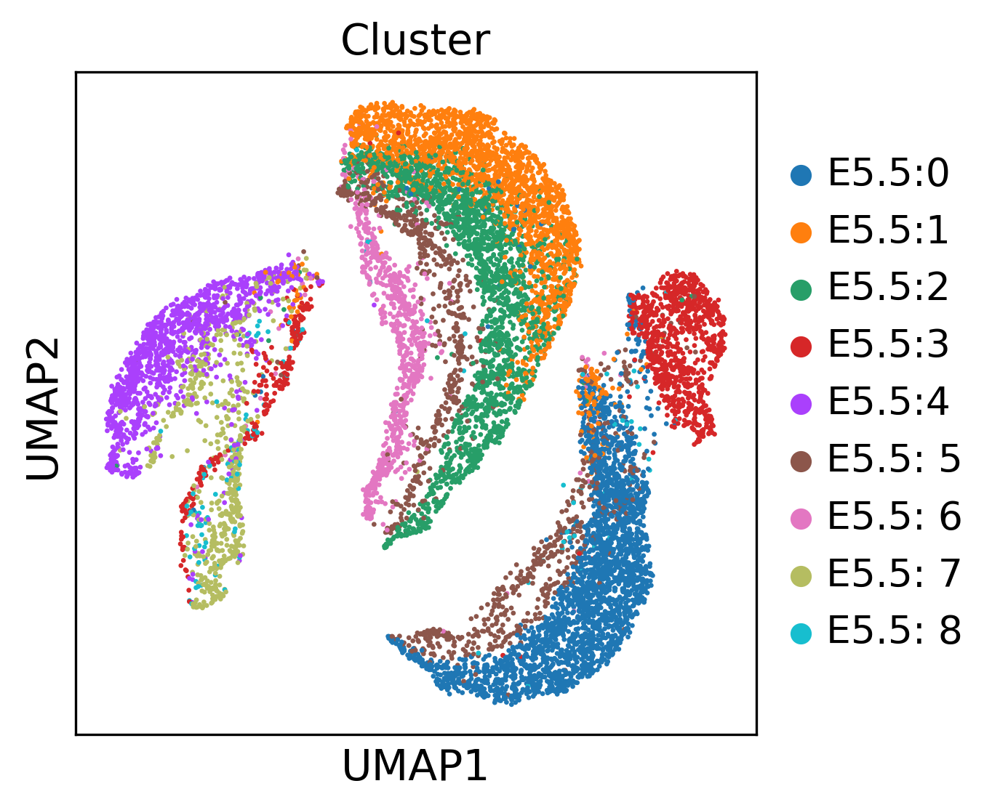

In [32]:
#E5.5 UMAP

sc.tl.umap(ge_E55)
sc.settings.set_figure_params(dpi=150)


sc.tl.louvain(ge_E55)


sc.pl.umap(ge_E55, color=['louvain'])
sc.pl.umap(ge_E55, title="", color=['CellType'])
sc.pl.umap(ge_E55, color=['Cluster'])

In [33]:
#E6.5 neighbor connectivity

sc.tl.pca(ge_E65, svd_solver='arpack')
sc.pp.neighbors(ge_E65, n_neighbors=15, n_pcs=25)
sc.pp.scale(ge_E65, max_value=10)

/home/juanthe3_gmail_com/anaconda3/envs/genomics/lib/python3.6/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../anaconda3/envs/genomics/lib/python3.6/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


... storing 'Cluster' as categorical
... storing 'Timepoint' as categorical
... storing 'CellType' as categorical


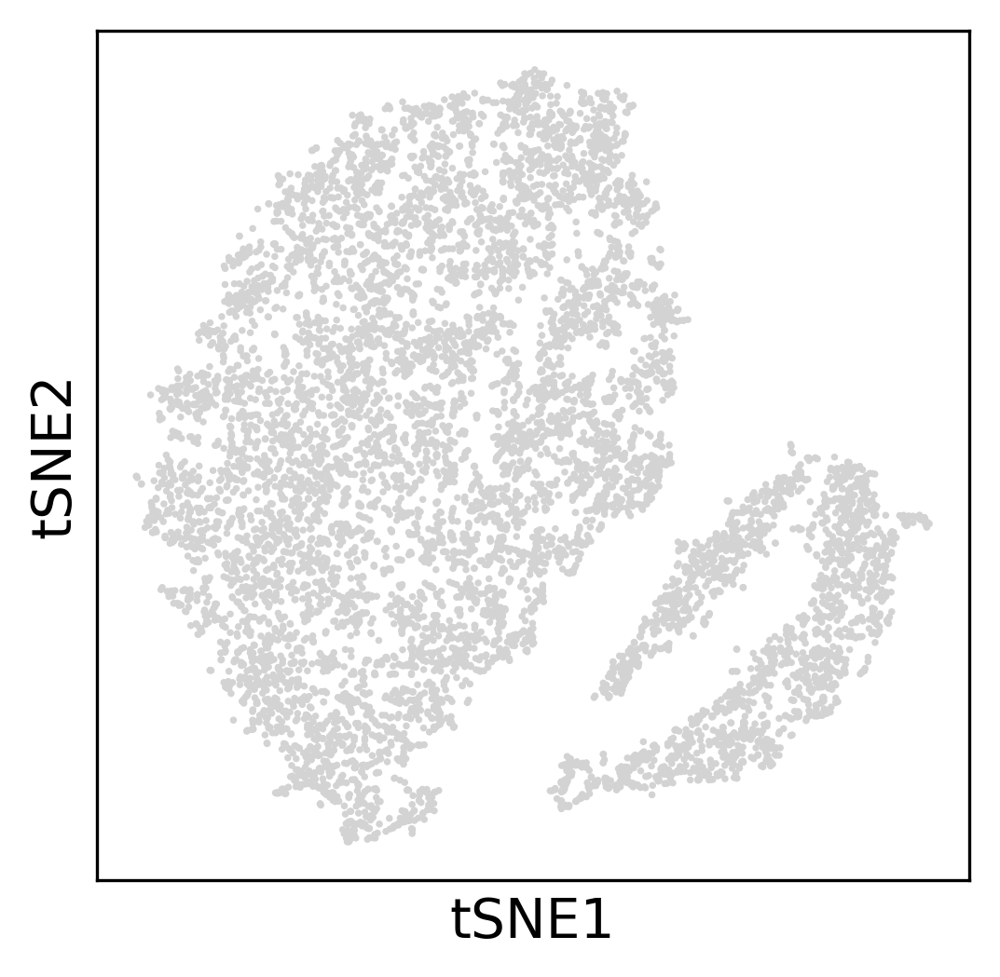

In [34]:
#E6.5 TSNE

sc.tl.tsne(ge_E65)
sc.settings.set_figure_params(dpi=150)
sc.pl.tsne(ge_E65)

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 0.9861969947814941 seconds
Jaccard graph constructed in 3.0834434032440186 seconds
Wrote graph to binary file in 1.21573805809021 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.810906
After 2 runs, maximum modularity is Q = 0.813731
Louvain completed 22 runs in 13.203254461288452 seconds
PhenoGraph complete in 18.531132698059082 seconds


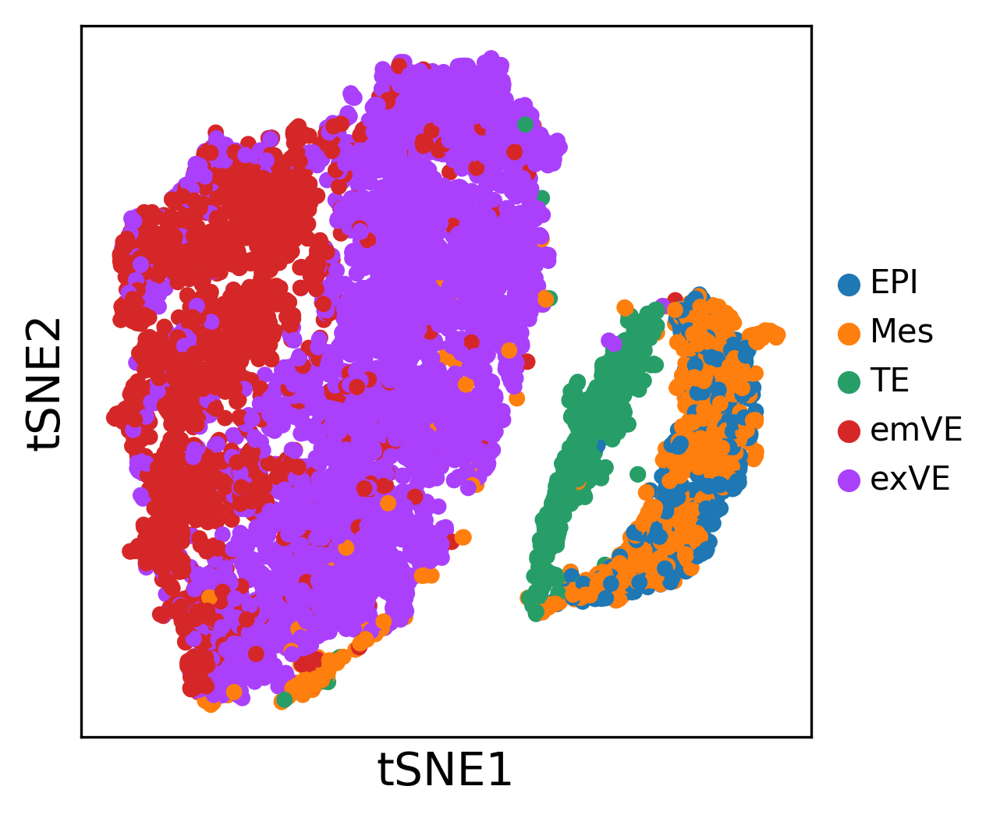

In [35]:
#E6.5 phenograph tSNE

result = sc.external.tl.phenograph(ge_E65.obsm['X_pca'], k = 30) #compute phenograph clusters
sc.tl.tsne(ge_E65, random_state = 7)
sc.pl.tsne(ge_E65, title="", color = ['CellType'], s = 100, palette = sc.pl.palettes.vega_20_scanpy, legend_fontsize = 10)



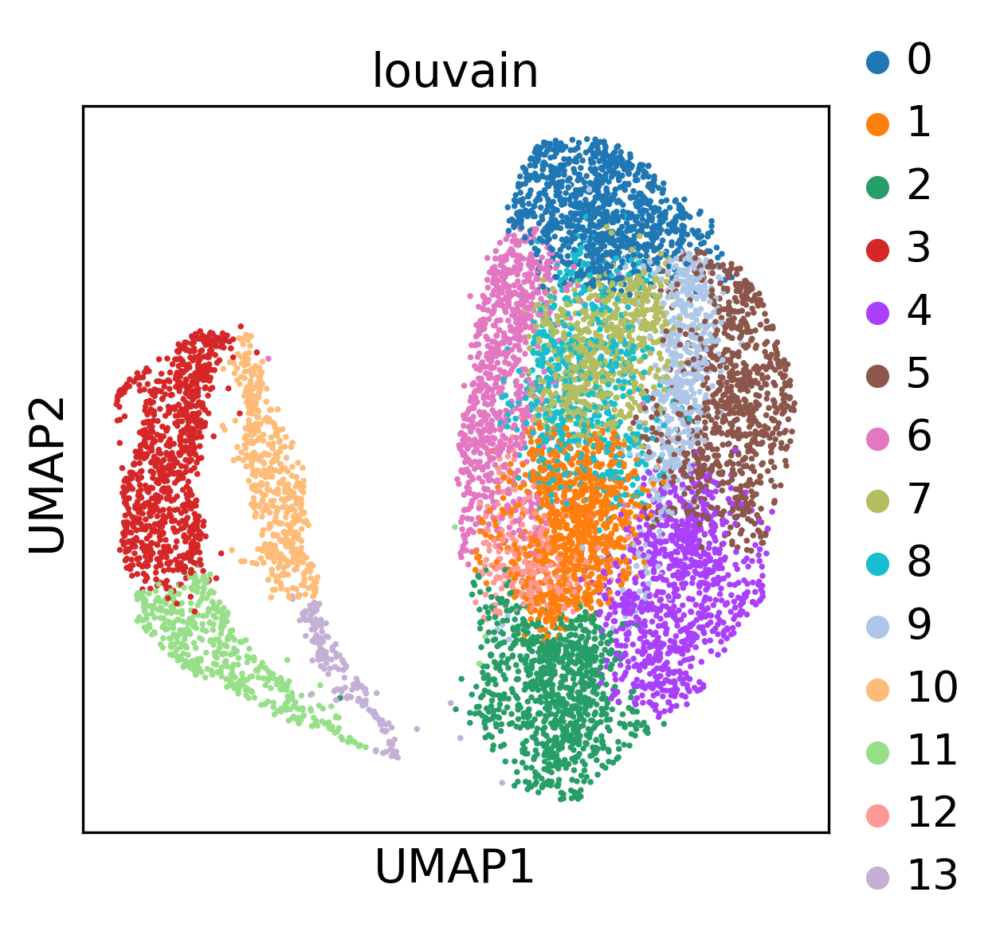

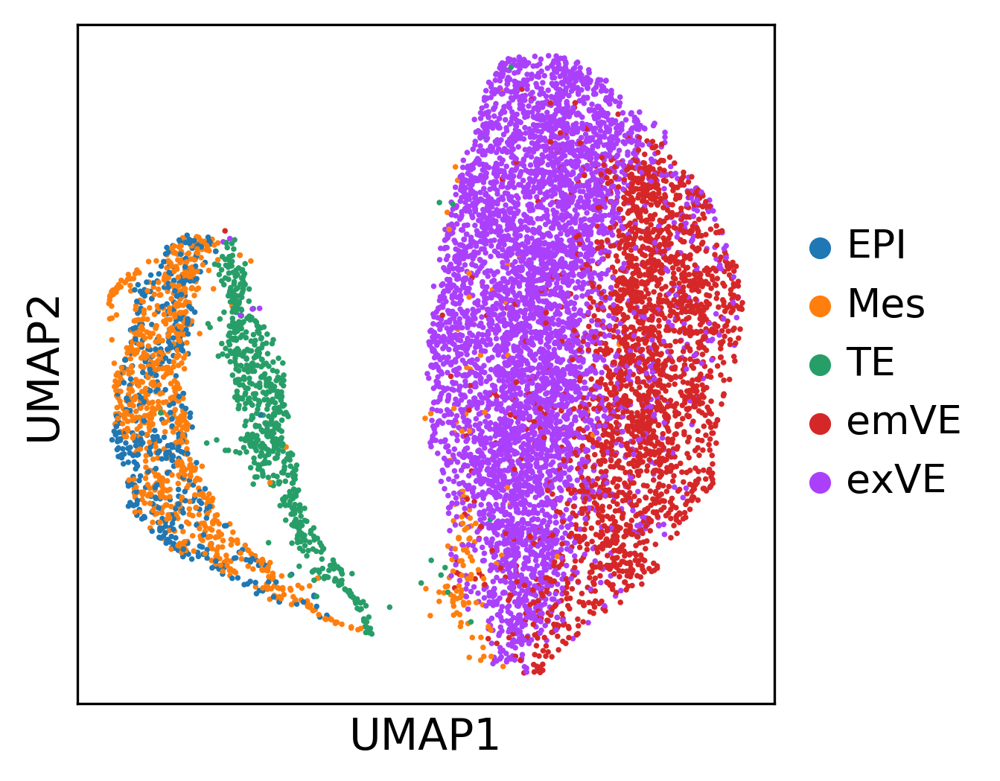

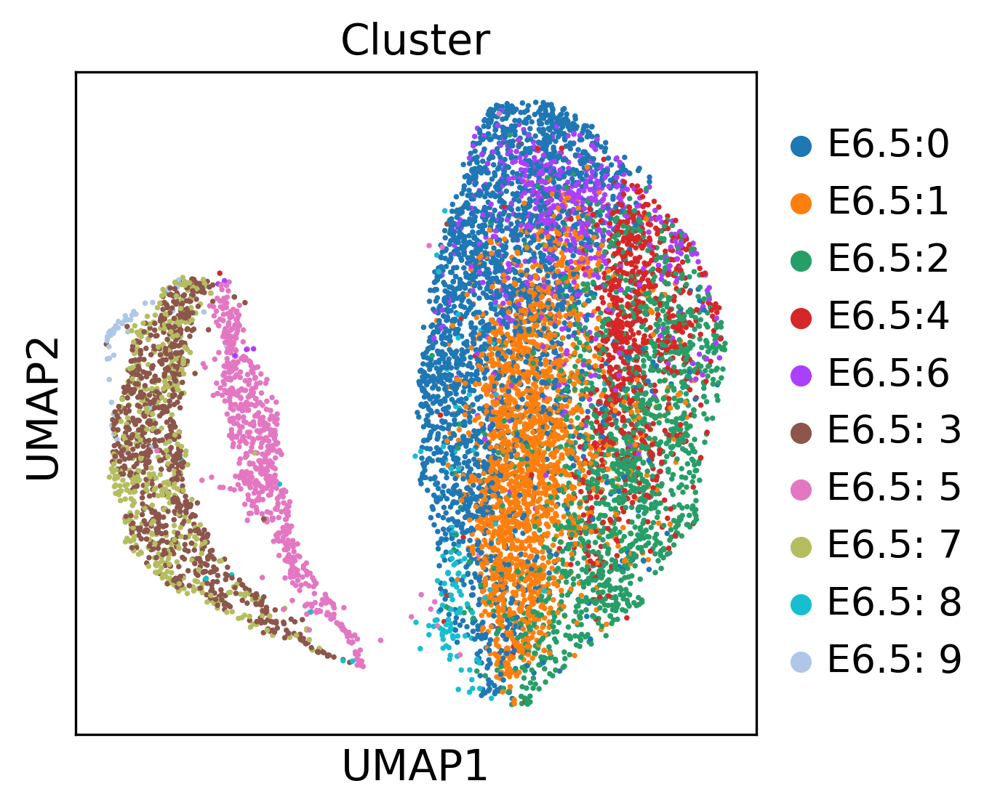

In [36]:
#E6.5 UMAP

sc.tl.umap(ge_E65)
sc.settings.set_figure_params(dpi=150)


sc.tl.louvain(ge_E65)


sc.pl.umap(ge_E65, color=['louvain'])
sc.pl.umap(ge_E65, title="", color=['CellType'])
sc.pl.umap(ge_E65, color=['Cluster'])

In [37]:
#E7.5 neighbor connectivity

sc.tl.pca(ge_E75, svd_solver='arpack')
sc.pp.neighbors(ge_E75, n_neighbors=15, n_pcs=25)
sc.pp.scale(ge_E75, max_value=10)

/home/juanthe3_gmail_com/anaconda3/envs/genomics/lib/python3.6/site-packages/numba/typed_passes.py:271: NumbaPerformanceWarning: 
The keyword argument 'parallel=True' was specified but no transformation for parallel execution was possible.

To find out why, try turning on parallel diagnostics, see http://numba.pydata.org/numba-doc/latest/user/parallel.html#diagnostics for help.

File "../anaconda3/envs/genomics/lib/python3.6/site-packages/umap/nndescent.py", line 47:
    @numba.njit(parallel=True)
    def nn_descent(
    ^

  state.func_ir.loc))


... storing 'Cluster' as categorical
... storing 'Timepoint' as categorical
... storing 'CellType' as categorical


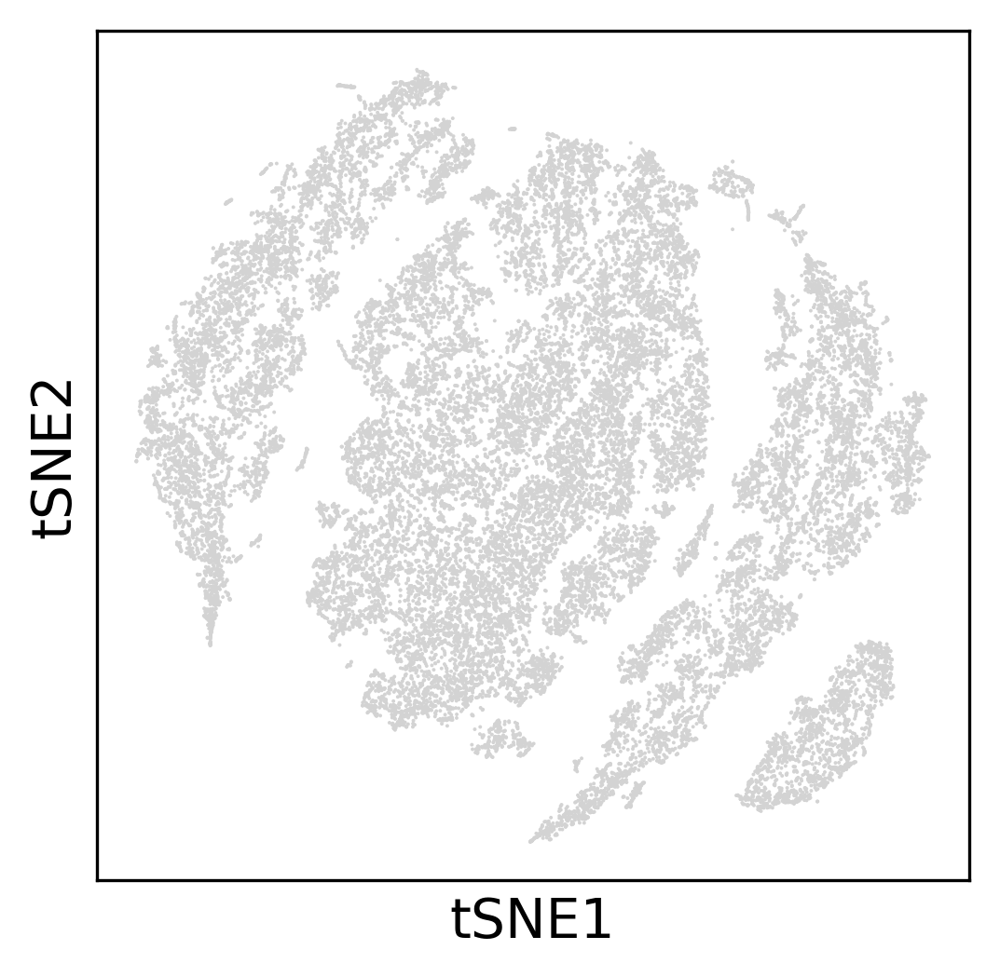

In [38]:
#E7.5 TSNE

sc.tl.tsne(ge_E75)
sc.settings.set_figure_params(dpi=150)
sc.pl.tsne(ge_E75)

Finding 30 nearest neighbors using minkowski metric and 'auto' algorithm
Neighbors computed in 10.716083765029907 seconds
Jaccard graph constructed in 5.506818771362305 seconds
Wrote graph to binary file in 4.050968408584595 seconds
Running Louvain modularity optimization
After 1 runs, maximum modularity is Q = 0.883843
After 5 runs, maximum modularity is Q = 0.885315
Louvain completed 25 runs in 33.88219094276428 seconds
PhenoGraph complete in 54.28284549713135 seconds


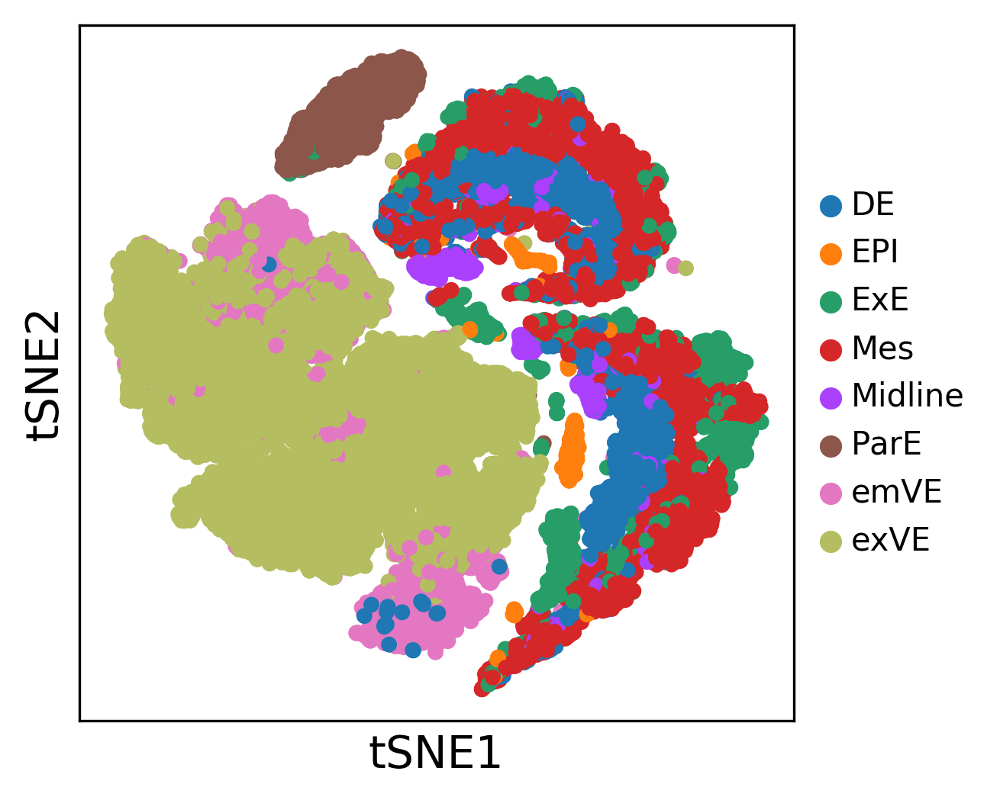

In [39]:
#E7.5 phenograph tSNE

result = sc.external.tl.phenograph(ge_E75.obsm['X_pca'], k = 30) #compute phenograph clusters
#ge_E75.obs['pheno'] = pd.Categorical(result[0])
sc.tl.tsne(ge_E75, random_state = 7)
sc.pl.tsne(ge_E75, title="", color = ['CellType'], s = 100, palette = sc.pl.palettes.vega_20_scanpy, legend_fontsize = 10)



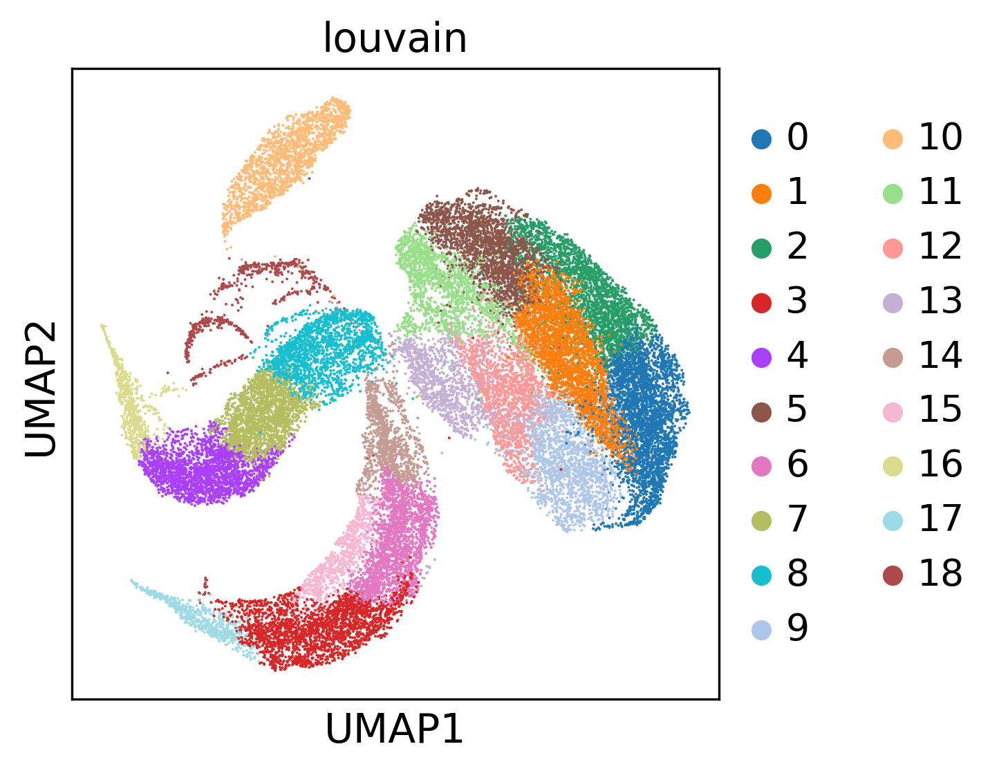

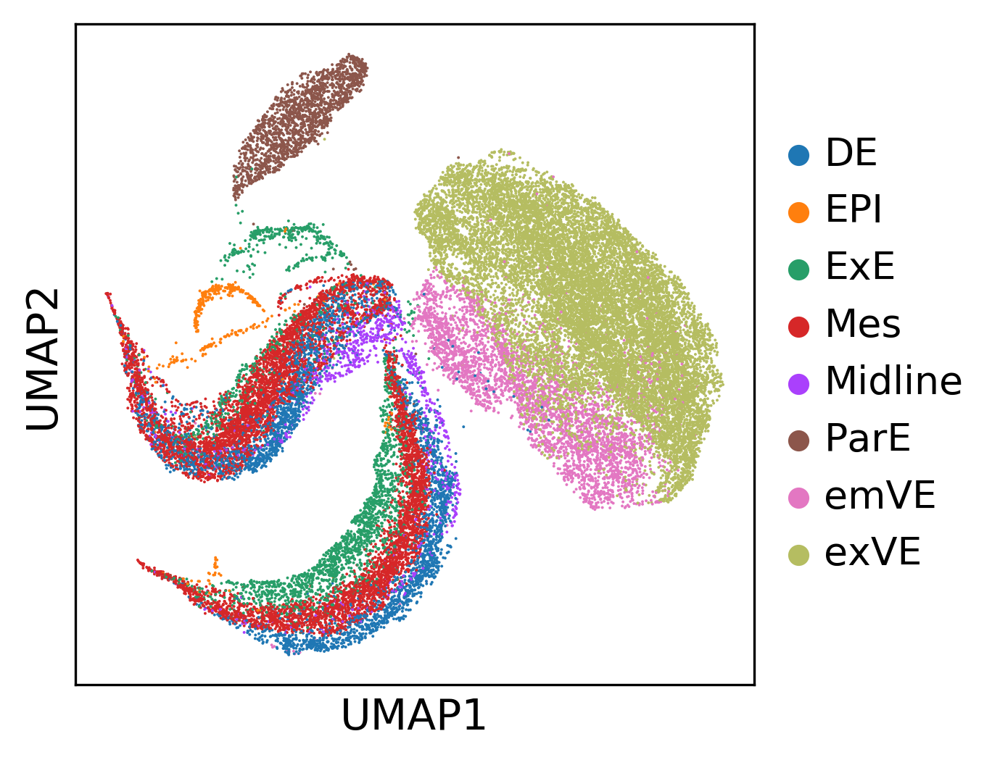

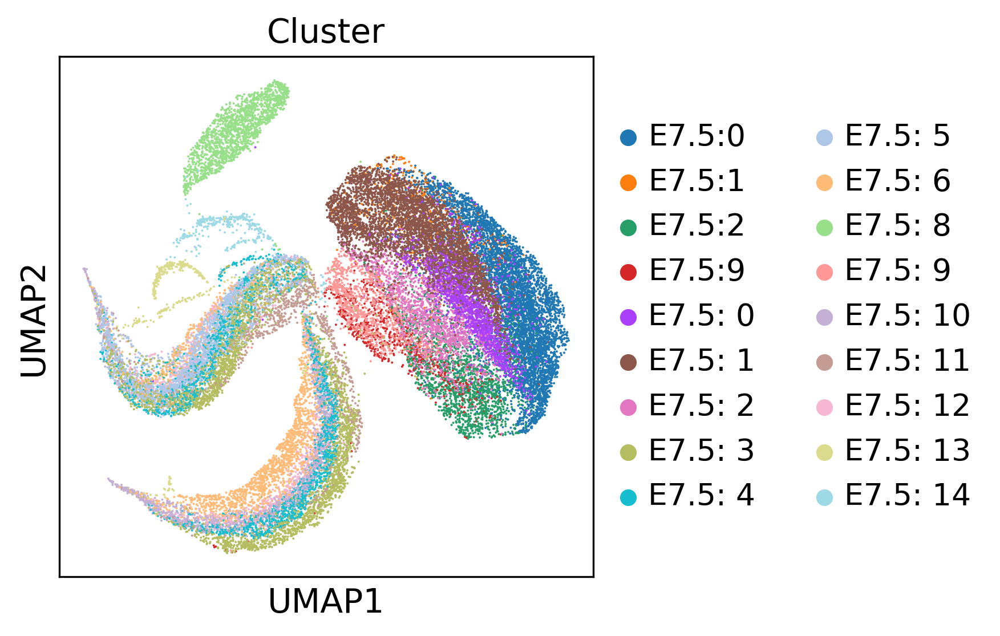

In [40]:
#E7.5 UMAP

sc.tl.umap(ge_E75)
sc.settings.set_figure_params(dpi=150)


sc.tl.louvain(ge_E75)


sc.pl.umap(ge_E75, color=['louvain'])
sc.pl.umap(ge_E75, title="", color=['CellType'])
sc.pl.umap(ge_E75, color=['Cluster'])